# Pipeline for scan analysis

This file is meant to store all the functions allowing to analyse the colors from scan images. The steps include:
- **flatfield correction** to remove the shade
- **extraction** of RGB values
- blank **normalisation**
- data **plotting**

### To Do To Clean
- A pipe for setting up a new scan as background: FF correction, extract blanks, save I0 matrices
- A pipe for sample quantification

In [85]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage.color import rgb2lab, lab2rgb
from skimage.draw import disk
from scipy.ndimage import gaussian_filter
import pandas as pd
import glob
import seaborn as sns

Should save the shading map as a file not to have to run it before every analysis !


### Functions

Loading Reference...
Generating Shading Map (Sigma=50)...


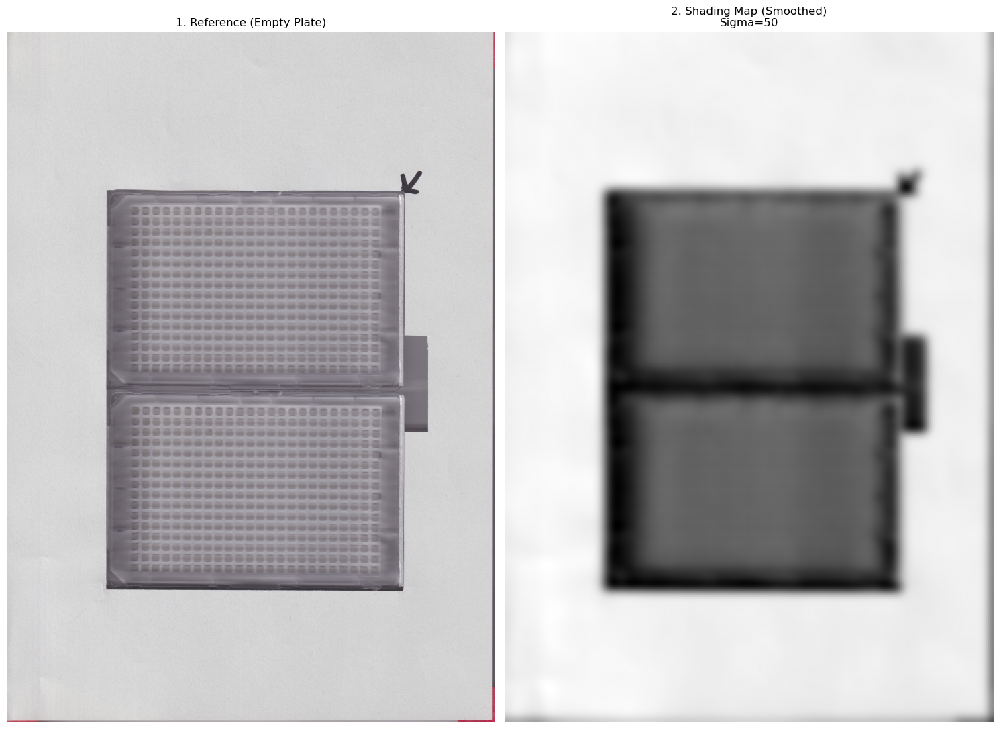

In [86]:
# %% Create shading map
# --- CONFIGURATION ---
# 1. Path to your EMPTY plate scan (Media + Dry)
### first file : '/Users/astr/Documents/Pigments/ScanQuantif/Scans/IMG_20260619_T0_empty.tif'
reference_file = '/Users/astr/Documents/Pigments/ScanQuantif/Scans/Combined Stacks.tif'

# 3. TUNABLE PARAMETER: Smoothing Sigma
# This controls how "blurry" the shading map is.
# - Too low: It sees the well edges and tries to correct them (bad).
# - Too high: It misses the gradient of the shadow.
# Start with 50 or 100. Adjust based on image size.
SMOOTH_SIGMA = 50

# --- STEP 1: LOAD REFERENCE (EMPTY PLATE) ---
print("Loading Reference...")
ref_img = np.array(Image.open(reference_file)).astype(float)

# If RGB, convert to Grayscale for the shading map (light is intensity-based)
if ref_img.ndim == 3:
    # Simple luminance: 0.299*R + 0.587*G + 0.114*B
    ref_gray = np.dot(ref_img[...,:3], [0.299, 0.587, 0.114])
else:
    ref_gray = ref_img

# --- STEP 2: CREATE THE SHADING MAP ---
print(f"Generating Shading Map (Sigma={SMOOTH_SIGMA})...")
# Gaussian blur removes the high-frequency details (wells) and keeps the low-frequency shadow
shading_map = gaussian_filter(ref_gray, sigma=SMOOTH_SIGMA)

# Normalize the map so its average is 1.0
# This ensures we don't brighten/darken the whole image, just correct relative differences
shading_map = shading_map / np.mean(shading_map)

# --- STEP 4: VISUALIZE RESULTS ---
fig, axes = plt.subplots(1, 2, figsize=(15, 12))

# 1. Original Reference
axes[0].imshow(ref_img.astype(int))
axes[0].set_title("1. Reference (Empty Plate)")
axes[0].axis('off')

# 2. The Calculated Shading Map
axes[1].imshow(shading_map, cmap='gray')
axes[1].set_title(f"2. Shading Map (Smoothed)\nSigma={SMOOTH_SIGMA}")
axes[1].axis('off')

plt.tight_layout()
plt.show()





We tested a sigma of 50, 60, 70, 80 and 100. The aim here is to blurry wells signal but keep the shades patterns associated to the plastic structure and its interaction with light. The 50 value was selected for the hole analysis after testing on Red_0617: it is a good compromise between brightness and reducing edge effect. Moreover, 50 pixels is the size a well, so we shouldn't go lower.

In [87]:
def FlatfieldCorrection(experimental_file, shading_map, show_plot=True):
    """
    Applies a pre-calculated shading map to an experimental image.
    
    Parameters:
    - experimental_file: Path to the raw image (.tif, .png, etc.)
    - shading_map: The normalized 2D numpy array (grayscale) generated from the empty plate.
    - show_plot: If True, displays a side-by-side comparison (Raw vs Corrected).
    
    Returns:
    - corrected_img: The corrected image as a numpy array (uint8).
    """
    # 1. Load Image
    exp_img = np.array(Image.open(experimental_file)).astype(float)
    
    # 2. Apply Correction Channel-by-Channel
    corrected_img = np.zeros_like(exp_img)
    
    # Ensure shading_map has 2 dimensions (H, W)
    if shading_map.ndim != 2:
        raise ValueError("shading_map must be a 2D grayscale array.")
        
    # Check dimensions match
    if exp_img.shape[:2] != shading_map.shape:
        # Optional: Resize shading_map if images differ slightly, but better to throw error
        raise ValueError(f"Image shape {exp_img.shape[:2]} does not match shading map {shading_map.shape}")

    for c in range(3): # R, G, B
        channel = exp_img[:, :, c]
        # Formula: Corrected = Raw / Shading_Map
        corrected_img[:, :, c] = (channel / (shading_map + 1e-5)) 
    
    # 3. Clip and Convert to Uint8
    corrected_img = np.clip(corrected_img, 0, 255).astype(np.uint8)
    
    # 4. Optional Plot
    if show_plot:
        fig, axes = plt.subplots(1, 2, figsize=(15, 6))
        
        axes[0].imshow(exp_img.astype(int))
        axes[0].set_title("Raw Experimental", fontsize=14)
        axes[0].axis('off')
        
        axes[1].imshow(corrected_img)
        axes[1].set_title("Corrected (Flat-Field)", fontsize=14)
        axes[1].axis('off')
        
        plt.suptitle(f"File: {experimental_file}", fontsize=12, y=1.05)
        plt.tight_layout()
        plt.show()
    
    return corrected_img

In [88]:


def getAllCenters(Corners, nRows, nCols):
    # corners is a 4x2, with lines TL, BL, TR, BR
    C_TL = Corners[0, :]  # top left
    C_BL = Corners[1, :]  # bottom left
    C_TR = Corners[2, :]  # top right
    C_BR = Corners[3, :]  # bottom right

    # Interpolation horizontale (haut et bas)
    # MATLAB: linspace(start, end, count)
    # Python: np.linspace(start, end, count)
    x_top = np.linspace(C_TL[0], C_TR[0], nCols)
    y_top = np.linspace(C_TL[1], C_TR[1], nCols)

    x_bot = np.linspace(C_BL[0], C_BR[0], nCols)
    y_bot = np.linspace(C_BL[1], C_BR[1], nCols)

    # Interpolation verticale pour chaque colonne
    X = np.zeros((nRows, nCols))
    Y = np.zeros((nRows, nCols))

    for c in range(nCols):
        # MATLAB: X(:,c) = linspace(..., nRows)
        # Python: X[:, c] = np.linspace(..., nRows)
        X[:, c] = np.linspace(x_top[c], x_bot[c], nRows)
        Y[:, c] = np.linspace(y_top[c], y_bot[c], nRows)

    return X, Y

def ExtractSaveRGB2csv(image_array, plate_corners_list, output_dir, file_prefix, nRows=16, nCols=24, rad=10):
    """
    Extracts RGB values from wells and saves them as CSV files.
    
    Parameters:
    - image_array: numpy array of the image (H, W, 3). Should be flat-field corrected.
    - plate_corners_list: List of corner arrays. e.g., [PlateA, PlateB]
    - output_dir: Path to the folder where CSVs will be saved.
    - file_prefix: String to start the filename (e.g., 'D2Ext', 'Blank').
    - nRows, nCols: Grid dimensions (default 16x24).
    - rad: Radius of the well mask in pixels.
    
    Returns:
    - AllPlateColors: List of numpy arrays (16x24x3) for further processing.
    """
    
    # Ensure output directory exists
    os.makedirs(output_dir, exist_ok=True)
    
    AllPlateColors = []
    channels = ['R', 'G', 'B']
    
    print(f"Starting extraction for {len(plate_corners_list)} plate(s)...")

    for pi, corners in enumerate(plate_corners_list):
        # 1. Get Grid Coordinates
        X, Y = getAllCenters(corners, nRows, nCols)
        x_coords = X.flatten().astype(int)
        y_coords = Y.flatten().astype(int)
        
        # 2. Initialize storage
        well_colors = np.zeros((nRows * nCols, 3))
        
        # 3. Extract colors for each well
        for i in range(len(x_coords)):
            cx, cy = x_coords[i], y_coords[i]
            
            # Bounding box with safety checks
            y_min = max(0, cy - rad)
            y_max = min(image_array.shape[0], cy + rad + 1)
            x_min = max(0, cx - rad)
            x_max = min(image_array.shape[1], cx + rad + 1)
            
            region = image_array[y_min:y_max, x_min:x_max]
            
            # Relative center
            center_y_rel = cy - y_min
            center_x_rel = cx - x_min
            
            # Dynamic Circular Mask
            h_reg, w_reg, _ = region.shape
            y_reg, x_reg = np.ogrid[:h_reg, :w_reg]
            dist_sq = (x_reg - center_x_rel)**2 + (y_reg - center_y_rel)**2
            mask = dist_sq <= rad**2
            
            if np.any(mask):
                well_colors[i] = np.mean(region[mask], axis=0)
            else:
                well_colors[i] = [0, 0, 0]
        
        # Reshape to (16, 24, 3) and store
        colors_plate = well_colors.reshape(nRows, nCols, 3)
        AllPlateColors.append(colors_plate)
        print(f"  -> Plate {pi+1} extracted.")

    # 4. Save CSVs
    print("Saving CSV files...")
    for p, colors_data in enumerate(AllPlateColors):
        for c_idx, ch in enumerate(channels):
            data = colors_data[:, :, c_idx]
            # Filename format: prefix_Plate1_R.csv
            filename = f"{file_prefix}_Plate{p+1}_{ch}.csv"
            filepath = os.path.join(output_dir, filename)
            
            pd.DataFrame(data).to_csv(filepath, index=False, header=False)
    
    print(f"Extraction complete. Saved {len(plate_corners_list)*3} files to {output_dir}")
    return AllPlateColors



# I - Apply flatfield correction

In [89]:
# --- CONFIGURATION ---
# Folder where your scans are located
scan_folder = '/Users/astr/Documents/Pigments/ScanQuantif/Scans/'
output_folder = '/Users/astr/Documents/Pigments/ScanQuantif/Scans_corrected'

# Pattern to find files (e.g., all .tif files)
# You can make this specific, e.g., '*Red*.tif' if you only want Red plates
file_pattern = os.path.join(scan_folder, '*20260617*.tif')  # ADAPT TO SAMPLE

# Get list of all matching files
all_files = glob.glob(file_pattern)

# Filter: Remove the reference image and any already corrected images
files_to_correct = [
    f for f in all_files 
    if ('_CORRECTED.tif' not in f) and ('T0_empty' not in f)
]

print(f"Found {len(files_to_correct)} images to process.")

# --- LOOP AND PROCESS ---
corrected_files_list = []

for file_path in files_to_correct:
    filename = os.path.basename(file_path)
    print(f"Processing: {filename}...")
    
    try:
        # 1. Apply Correction (show_plot=False for speed)
        corrected_img = FlatfieldCorrection(file_path, shading_map, show_plot=False)
        
        # 2. Define Output Path (CHANGED: Save to output_folder)
        base_name, ext = os.path.splitext(filename) # Split only the filename, not the full path
        output_path = os.path.join(output_folder, f"{base_name}_CORRECTED{ext}")
        
        # 3. Save
        Image.fromarray(corrected_img).save(output_path)
        corrected_files_list.append(output_path)
        
        print(f"  -> Saved: {os.path.basename(output_path)}")
        
    except Exception as e:
        print(f"  -> ERROR processing {filename}: {e}")

print("\n--- Batch Complete ---")
print(f"Successfully corrected {len(corrected_files_list)} images.")

Found 3 images to process.
Processing: IMG_20260617_Red_12.tif...
  -> Saved: IMG_20260617_Red_12_CORRECTED.tif
Processing: IMG_20260617_Red_67.tif...
  -> Saved: IMG_20260617_Red_67_CORRECTED.tif
Processing: IMG_20260617_Red_35.tif...
  -> Saved: IMG_20260617_Red_35_CORRECTED.tif

--- Batch Complete ---
Successfully corrected 3 images.


# II - Extract RGB values

It is still complex to fully functionalize this step as the plate's corners have to be extracted from ImageJ... 
In the ideal pipe, all corners coordinates are saved in one file that is called by the ExtractRGB function ==> TODO

>>> First done for blank controls


### Combined stacks (0702_light_ctrl)

To adapt if willing to change reference data for background normalization ! 

In [18]:
# --- 1. Load your Corrected Image ---
picF = '/Users/astr/Documents/Pigments/ScanQuantif/Scans_corrected/0702_Combined_Stacks_CORRECTED.tif'

im = np.array(Image.open(picF))

# --- 2. Define Corners ---
PlateA = np.array([[1308,1820], [1292,3420], [3740,1836], [3732,3428]])
PlateB = np.array([[1300,3852], [1292,5452], [3748,3876], [3740,5476]])
allPlates = [PlateA, PlateB]

# --- 3. Run the Function ---
# Make sure getAllCenters is defined in your session before running this!
output_folder = '/Users/astr/Documents/Pigments/ScanQuantif/Background_Matrices'
file_name_prefix = '0702_Combined_Stacks_CORRECTED' # Changes the start of the CSV filename

AllPlateColors = ExtractSaveRGB2csv(
    image_array=im, 
    plate_corners_list=allPlates, 
    output_dir=output_folder, 
    file_prefix=file_name_prefix,
    rad=10 # You can adjust radius here easily
)

print("Done! You can now load the CSVs for contrast enhancement.")

Starting extraction for 2 plate(s)...
  -> Plate 1 extracted.
  -> Plate 2 extracted.
Saving CSV files...
Extraction complete. Saved 6 files to /Users/astr/Documents/Pigments/ScanQuantif/Background_Matrices
Done! You can now load the CSVs for contrast enhancement.


### DeBug loop

In [12]:
import os
import glob
import numpy as np

# --- CONFIGURATION ---
search_prefix = 'IMG_20260703_gradient' 
coords_file = '/Users/astr/Documents/Pigments/ScanQuantif/Coordinates/CornerCoords.txt'

print(f"--- DEBUG MODE: Reading {coords_file} ---\n")

coords_db = {}

try:
    with open(coords_file, 'r') as f:
        lines = f.readlines()
    
    i = 0
    while i < len(lines):
        line = lines[i]
        raw_line = repr(line) # Shows hidden characters like \n, \r, spaces
        clean_line = line.strip()
        
        # Check if line looks like a filename
        if clean_line.endswith('.tif'):
            print(f"Found Filename Line:")
            print(f"  Raw:   {raw_line}")
            print(f"  Clean: '{clean_line}'")
            
            # Check prefix
            if clean_line.startswith(search_prefix):
                print(f"  -> Matches Prefix '{search_prefix}'")
                
                # Try to read next two lines
                if i + 2 < len(lines):
                    line_a = lines[i+1].strip()
                    line_b = lines[i+2].strip()
                    
                    if 'np.array' in line_a and 'np.array' in line_b:
                        print(f"  -> Coordinates found. Adding to database.")
                        
                        # Parse
                        try:
                            arr_str_a = line_a.split('np.array(')[1].replace(')', '').strip()
                            arr_str_b = line_b.split('np.array(')[1].replace(')', '').strip()
                            PlateA = np.array(eval(arr_str_a))
                            PlateB = np.array(eval(arr_str_b))
                            coords_db[clean_line] = [PlateA, PlateB]
                        except Exception as e:
                            print(f"  -> ERROR parsing arrays: {e}")
                        i += 3
                        continue
                    else:
                        print(f"  -> WARNING: Next lines do not look like coordinates.")
                else:
                    print(f"  -> WARNING: End of file reached unexpectedly.")
            else:
                print(f"  -> Skipped (Does not start with prefix)")
            print("-" * 30)
        
        i += 1

    print(f"\n--- SUMMARY ---")
    print(f"Total entries in database: {len(coords_db)}")
    print("Keys in database:")
    for key in coords_db.keys():
        print(f"  - '{key}'")

except Exception as e:
    print(f"Critical Error: {e}")

--- DEBUG MODE: Reading /Users/astr/Documents/Pigments/ScanQuantif/Coordinates/CornerCoords.txt ---

Found Filename Line:
  Raw:   '384_20260327_follow-up_lakeDilution_d10.tif\n'
  Clean: '384_20260327_follow-up_lakeDilution_d10.tif'
  -> Skipped (Does not start with prefix)
------------------------------
Found Filename Line:
  Raw:   'IMG_20260608_Red_1to4.tif\n'
  Clean: 'IMG_20260608_Red_1to4.tif'
  -> Skipped (Does not start with prefix)
------------------------------
Found Filename Line:
  Raw:   'IMG_20260617_Red_12.tif\n'
  Clean: 'IMG_20260617_Red_12.tif'
  -> Skipped (Does not start with prefix)
------------------------------
Found Filename Line:
  Raw:   'IMG_20260617_Red_35.tif\n'
  Clean: 'IMG_20260617_Red_35.tif'
  -> Skipped (Does not start with prefix)
------------------------------
Found Filename Line:
  Raw:   'IMG_20260617_Red_67.tif\n'
  Clean: 'IMG_20260617_Red_67.tif'
  -> Skipped (Does not start with prefix)
------------------------------
Found Filename Line:
  Ra

In [90]:
# --- CONFIGURATION ---
search_prefix = 'IMG_20260617_Red_'
scans_dir = '/Users/astr/Documents/Pigments/ScanQuantif/Scans_corrected'
coords_file = '/Users/astr/Documents/Pigments/ScanQuantif/Coordinates/CornerCoords.txt'
output_folder = '/Users/astr/Documents/Pigments/ScanQuantif/RGB_extracted'
rad = 10

print(f"Loading coordinates from: {coords_file}\n")

# 1. Load Coordinates into a Dictionary
# Key: Filename (e.g., 'IMG_20260617_Red_12.tif')
# Value: [PlateA_array, PlateB_array]
coords_db = {}

try:
    with open(coords_file, 'r') as f:
        lines = f.readlines()
    
    i = 0
    while i < len(lines):
        line = lines[i].strip()
        
        # Skip empty lines
        if not line or not line.endswith('.tif'):
            i += 1
            continue
        
        # The line IS the filename now (no path to extract!)
        original_filename = line
        
        # Check if it matches our search prefix
        if not original_filename.startswith(search_prefix):
            i += 1
            continue
        
        # Ensure we have the next 2 lines for coordinates
        if i + 2 >= len(lines):
            print(f"Warning: Incomplete block for {original_filename}. Skipping.")
            break
            
        line_a = lines[i+1].strip()
        line_b = lines[i+2].strip()
        
        try:
            # Parse the numpy array strings
            # Handles: PlateA = np.array([[...]])
            if 'np.array(' in line_a:
                arr_str_a = line_a.split('np.array(')[1].replace(')', '').strip()
                arr_str_b = line_b.split('np.array(')[1].replace(')', '').strip()
                
                PlateA = np.array(eval(arr_str_a))
                PlateB = np.array(eval(arr_str_b))
                
                coords_db[original_filename] = [PlateA, PlateB]
                # print(f"Loaded: {original_filename}")
                i += 3
            else:
                # If the line doesn't look like a coordinate definition, skip
                i += 1
                
        except Exception as e:
            print(f"Error parsing coords for {original_filename}: {e}")
            i += 3

except FileNotFoundError:
    print(f"Error: Coordinates file not found at {coords_file}")
    coords_db = {}

print(f"Loaded coordinates for {len(coords_db)} files.\n")

# 2. Find all matching corrected TIFF files in the folder
pattern = os.path.join(scans_dir, f"{search_prefix}*_CORRECTED*.tif")
file_list = glob.glob(pattern)


if not file_list:
    print(f"ERROR: No files found matching '{pattern}' in {scans_dir}.")
else:
    print(f"Found {len(file_list)} image(s) to process.\n")

    # 3. Loop and Process
    for full_path in file_list:
        corrected_filename = os.path.basename(full_path) 
        # e.g., IMG_20260617_Red_12_CORRECTED.tif
        
        # Derive the Original Filename to look up in coords_db
        # Simply remove '_CORRECTED.tif' to match the text file entry
        original_filename = corrected_filename.replace('_CORRECTED.tif', '.tif')
        
        if original_filename not in coords_db:
            print(f"WARNING: No coordinates found for {corrected_filename}.")
            print(f"         (Expected entry in .txt: {original_filename})")
            continue
            
        plate_corners = coords_db[original_filename]
        
        # Define Prefix for CSVs (e.g., '20260617_Red_12')
        csv_prefix = corrected_filename.replace('IMG_', '').replace('_CORRECTED.tif', '')
        
        print(f"Processing: {corrected_filename}")
        
        try:
            im = np.array(Image.open(full_path))
            
            AllPlateColors = ExtractSaveRGB2csv(
                image_array=im, 
                plate_corners_list=plate_corners, 
                output_dir=output_folder, 
                file_prefix=csv_prefix,
                rad=rad
            )
            print(f"  -> Success!\n")
            
        except Exception as e:
            print(f"  -> ERROR: {e}\n")

print("Batch processing complete.")

Loading coordinates from: /Users/astr/Documents/Pigments/ScanQuantif/Coordinates/CornerCoords.txt

Loaded coordinates for 3 files.

Found 3 image(s) to process.

Processing: IMG_20260617_Red_12_CORRECTED.tif
Starting extraction for 2 plate(s)...
  -> Plate 1 extracted.
  -> Plate 2 extracted.
Saving CSV files...
Extraction complete. Saved 6 files to /Users/astr/Documents/Pigments/ScanQuantif/RGB_extracted
  -> Success!

Processing: IMG_20260617_Red_35_CORRECTED.tif
Starting extraction for 2 plate(s)...
  -> Plate 1 extracted.
  -> Plate 2 extracted.
Saving CSV files...
Extraction complete. Saved 6 files to /Users/astr/Documents/Pigments/ScanQuantif/RGB_extracted
  -> Success!

Processing: IMG_20260617_Red_67_CORRECTED.tif
Starting extraction for 2 plate(s)...
  -> Plate 1 extracted.
  -> Plate 2 extracted.
Saving CSV files...
Extraction complete. Saved 6 files to /Users/astr/Documents/Pigments/ScanQuantif/RGB_extracted
  -> Success!

Batch processing complete.


# III - Blank spatial normalisation (BLL)

### Function

In [91]:
def compute_od_matrix(sample_prefix, sample_plate_num, 
                      background_dir='/Users/astr/Documents/Pigments/ScanQuantif/Background_Matrices',
                      data_dir='/Users/astr/Documents/Pigments/ScanQuantif',
                      output_dir='/Users/astr/Documents/Pigments/ScanQuantif/OD_output',
                      plot_results=True):
    """
    Computes the Optical Density (OD) matrix for a specific sample plate using spatial background correction.
    
    Formula: OD = -log10( Sample_Intensity / I0_Intensity )
    
    Parameters:
    - sample_prefix: Prefix of the sample file (e.g., '0617_Red_12')
    - sample_plate_num: Plate number (e.g., '1' or '2')
    - background_dir: Folder containing I0_Matrix_R.csv, etc.
    - data_dir: Folder containing the sample CSVs.
    - output_dir: Folder where OD CSVs will be saved.
    - plot_results: If True, displays a heatmap of the computed OD.
    
    Returns:
    - od_matrices: Dictionary {'R': matrix, 'G': matrix, 'B': matrix}
    """
    
    # Ensure output directory exists
    os.makedirs(output_dir, exist_ok=True)
    
    channels = ['R', 'G', 'B']
    od_matrices = {}
    
    print(f"Computing OD for {sample_prefix}_Plate{sample_plate_num}...\n")

    for ch in channels:
        # 1. Define File Paths
        sample_file = f"{sample_prefix}_Plate{sample_plate_num}_{ch}.csv"
        sample_path = os.path.join(data_dir, sample_file)
        
        i0_file = f"I0_Matrix_{ch}.csv"
        i0_path = os.path.join(background_dir, i0_file)
        
        # 2. Load Data
        try:
            # Load Sample
            df_sample = pd.read_csv(sample_path, header=None)
            data_sample = df_sample.to_numpy()
            
            # Load Background (I0)
            df_i0 = pd.read_csv(i0_path, header=None)
            data_i0 = df_i0.to_numpy()
            
            if data_sample.shape != data_i0.shape:
                print(f"ERROR: Shape mismatch for {ch}-channel. Sample: {data_sample.shape}, I0: {data_i0.shape}")
                continue
                
        except FileNotFoundError as e:
            print(f"ERROR: File not found for {ch}-channel. {e}")
            continue

        # 3. Apply Beer-Lambert Law
        # OD = -log10( I / I0 )
        # Add small epsilon to avoid division by zero or log(0)
        epsilon = 1e-6
        
        # Element-wise division
        ratio = (data_sample + epsilon) / (data_i0 + epsilon)
        
        # Compute OD
        od_matrix = -np.log10(ratio)
        
        # Handle negative ODs (if sample is brighter than background, usually noise)
        # We keep them for now to see the distribution, but you can clip to 0 if preferred:
        # od_matrix = np.clip(od_matrix, 0, None) 
        
        od_matrices[ch] = od_matrix
        
        # 4. Save Result
        output_filename = f"OD_{sample_prefix}_Plate{sample_plate_num}_{ch}.csv"
        output_path = os.path.join(output_dir, output_filename)
        
        pd.DataFrame(od_matrix).to_csv(output_path, index=False, header=False)
        
        print(f"--> {ch}-Channel: OD computed. Range [{od_matrix.min():.3f} - {od_matrix.max():.3f}]. Saved to {output_filename}")

    print(f"\nDone! OD matrices saved in: {output_dir}")
    return od_matrices

# --- EXAMPLE USAGE ---
# Uncomment and run this line to test with your data:
# compute_od_matrix('0617_Red_12', '1')

In [92]:
# --- CONFIGURATION ---
rgb_source_dir = '/Users/astr/Documents/Pigments/ScanQuantif/RGB_extracted' 
background_dir = '/Users/astr/Documents/Pigments/ScanQuantif/Background_Matrices'
output_dir = '/Users/astr/Documents/Pigments/ScanQuantif/OD_output'

# Prefix filter (optional): Set to '' to process ALL files, or e.g. '0617' to filter
file_filter = '20260617' 

print(f"Scanning for RGB CSVs in: {rgb_source_dir}\n")

# 1. Find all Plate CSVs
# We look for files like: {prefix}_Plate1_R.csv
# We use a broad pattern and then filter in python to avoid duplicates
pattern = os.path.join(rgb_source_dir, "*_Plate*_R.csv")
if file_filter:
    pattern = os.path.join(rgb_source_dir, f"*{file_filter}*Plate*_R.csv")

r_files = glob.glob(pattern)

if not r_files:
    print("No RGB files found. Check the directory path and file naming pattern.")
else:
    print(f"Found {len(r_files)} Red channel files.\n")

    # 2. Extract Unique Plate Identifiers
    # We want to process each plate once, not once per channel.
    # Format expected: "PREFIX_PlateN_R.csv" -> We extract "PREFIX_PlateN"
    plates_to_process = set()

    for f in r_files:
        filename = os.path.basename(f)
        # Remove '_R.csv' to get the base plate identifier
        # Example: "0617_Red_12_Plate1_R.csv" -> "0617_Red_12_Plate1"
        base_name = filename.replace('_R.csv', '')
        plates_to_process.add(base_name)

    sorted_plates = sorted(list(plates_to_process))
    print(f"Identified {len(sorted_plates)} unique plates to process.\n")

    # 3. Loop and Compute OD
    for plate_id in sorted_plates:
        # Reconstruct the prefix and plate number for the function
        # Assuming format: "PREFIX_PlateN"
        # We split from the right to handle prefixes that might contain the word "Plate"
        parts = plate_id.rsplit('_Plate', 1)
        
        if len(parts) != 2:
            print(f"Skipping {plate_id}: Filename format not recognized (expected *_PlateN).")
            continue
            
        prefix = parts[0]
        plate_num = parts[1]
        
        print(f"Processing: {prefix} - Plate {plate_num}")
        
        try:
            # Call your existing function
            # Note: Ensure compute_od_matrix is defined in your session
            compute_od_matrix(
                sample_prefix=prefix,
                sample_plate_num=plate_num,
                background_dir=background_dir,
                data_dir=rgb_source_dir,
                output_dir=output_dir,
                plot_results=False # Set to True if you want to see plots during the loop
            )
            print(f"  -> OD Matrices generated successfully.\n")
            
        except Exception as e:
            print(f"  -> ERROR: {e}\n")

print("Batch OD calculation complete.")
print(f"Results saved in: {output_dir}")

Scanning for RGB CSVs in: /Users/astr/Documents/Pigments/ScanQuantif/RGB_extracted

Found 6 Red channel files.

Identified 6 unique plates to process.

Processing: 20260617_Red_12 - Plate 1
Computing OD for 20260617_Red_12_Plate1...

--> R-Channel: OD computed. Range [-0.020 - 0.062]. Saved to OD_20260617_Red_12_Plate1_R.csv
--> G-Channel: OD computed. Range [-0.007 - 0.100]. Saved to OD_20260617_Red_12_Plate1_G.csv
--> B-Channel: OD computed. Range [0.004 - 0.137]. Saved to OD_20260617_Red_12_Plate1_B.csv

Done! OD matrices saved in: /Users/astr/Documents/Pigments/ScanQuantif/OD_output
  -> OD Matrices generated successfully.

Processing: 20260617_Red_12 - Plate 2
Computing OD for 20260617_Red_12_Plate2...

--> R-Channel: OD computed. Range [-0.030 - 0.097]. Saved to OD_20260617_Red_12_Plate2_R.csv
--> G-Channel: OD computed. Range [-0.017 - 0.147]. Saved to OD_20260617_Red_12_Plate2_G.csv
--> B-Channel: OD computed. Range [-0.008 - 0.122]. Saved to OD_20260617_Red_12_Plate2_B.csv

Do

# Plotting

### Functions

In [93]:
def plot_plate_heatmap(csv_path, layout_type='none', title=None, data_type='RGB'):
    """
    Plots a 16x24 heatmap from a CSV file.
    
    Parameters:
    - csv_path: Full path to the CSV file.
    - layout_type: 'type_A', 'type_B', 'type_C', 'type_D', or 'none'.
    - title: Custom title.
    - data_type: 'RGB' (Integers, Dark=Low) or 'OD' (3 decimals, Dark=High).
    """
    
    # 1. Load Data
    try:
        df = pd.read_csv(csv_path, header=None)
        data = df.to_numpy().reshape(16, 24)
    except FileNotFoundError:
        print(f"Error: File not found at {csv_path}")
        return
    except Exception as e:
        print(f"Error loading file: {e}")
        return

    # 2. Get Tags (for borders)
    tags = np.full((16, 24), -1, dtype=int)
    if layout_type == 'type_A':
        tags[0, ::2] = 1
    elif layout_type == 'type_B':
        tags[:2, :] = 1
    elif layout_type == 'type_C':
        tags[0, :] = 1
        tags[1, ::2] = 1
    elif layout_type == 'type_D':
        tags[0, :] = 1
    elif layout_type == 'type_E':
        tags[:, 11] = 1
        tags[:, 12] = 1

    # 3. Normalize Data for Colormap (0 to 1)
    v_min, v_max = data.min(), data.max()
    if v_max > v_min:
        norm_data = (data - v_min) / (v_max - v_min)
    else:
        norm_data = np.zeros_like(data)

    # 4. Select Colormap based on Data Type
    if data_type == 'OD':
        # OD: Low Value (No pigment) = Light, High Value (Pigment) = Dark
        cmap = plt.get_cmap('Reds') 
        # In 'Reds', 0.0 is white, 1.0 is dark red.
    else:
        # RGB: Low Value (Dark) = Dark Red, High Value (Bright) = Light/White
        cmap = plt.get_cmap('Reds_r') 
        # In 'Reds_r', 0.0 is dark red, 1.0 is white.

    rgba_image = cmap(norm_data)

    # 5. Create Plot
    plt.figure(figsize=(12, 8))
    plt.imshow(rgba_image)
    
    if title is None:
        title = f"Heatmap: {csv_path.split('/')[-1]}"
    plt.title(title, fontsize=16, fontweight='bold')
    plt.axis('off')

    # 6. Add Black Borders to Controls
    if layout_type != 'none':
        ctrl_indices = np.argwhere(tags == 1)
        for i, j in ctrl_indices:
            rect = plt.Rectangle((j - 0.5, i - 0.5), 1, 1,
                                 fill=False, edgecolor='black', linewidth=2.5)
            plt.gca().add_patch(rect)

    # 7. Add Text Overlay with Dynamic Formatting & Color
    for i in range(16):
        for j in range(24):
            val = data[i, j]
            
            # --- Format Text ---
            if data_type == 'OD':
                txt = f"{val:.3f}"
                # --- Text Color for OD ---
                # High OD = Dark Background -> White Text
                # Low OD = Light Background -> Black Text
                # Threshold: If normalized value > 0.4 (approx mid-range), make text white
                if norm_data[i, j] > 0.4: 
                    t_color = 'white'
                    f_weight = 'bold'
                else:
                    t_color = 'black'
                    f_weight = 'normal'
            else:
                # --- Format & Color for RGB ---
                txt = str(int(np.round(val)))
                # Low Value = Dark Background -> White Text
                if val < (v_min + 0.4 * (v_max - v_min)):
                    t_color = 'white'
                    f_weight = 'bold'
                else:
                    t_color = 'black'
                    f_weight = 'normal'
            
            plt.text(j, i, txt, ha='center', va='center', 
                     fontsize=8, color=t_color, fontweight=f_weight)

    # --- SAVE HEATMAP ---
    save_dir = '/Users/astr/Documents/Pigments/ScanQuantif/Graphs'
    os.makedirs(save_dir, exist_ok=True)
    
    # Create filename from input CSV path
    file_name = os.path.basename(csv_path).replace('.csv', '.png')
    save_path = os.path.join(save_dir, f"Heatmap_{file_name}")
    
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"Heatmap saved: {save_path}")

    plt.tight_layout()
    plt.show()

# --- EXAMPLE USAGE ---

# 1. Plot RGB Data (Dark=Low, Light=High)
# plot_plate_heatmap('.../0617_Red_12_Plate1_R.csv', layout_type='type_A', data_type='RGB')

# 2. Plot OD Data (Light=Low, Dark=High)
# plot_plate_heatmap('.../OD_output/OD_0617_Red_12_Plate1_R.csv', layout_type='type_A', data_type='OD')

def plot_od_histograms(od_file_prefix, plate_num, layout_type='type_A', 
                       data_dir='/Users/astr/Documents/Pigments/ScanQuantif/OD_output',
                       bins=40, title=None):
    """
    Plots normalized frequency histograms of OD values for a single plate.
    Controls are shown in Red, Samples in Grey.
    
    Parameters:
    - od_file_prefix: Prefix of the OD files (e.g., 'OD_0617_Red_12')
    - plate_num: Plate number (e.g., '1')
    - layout_type: 'type_A', 'type_B', etc. (to identify controls)
    - data_dir: Folder containing the OD CSVs.
    - bins: Number of bins for the histogram.
    """
    
    channels = ['R', 'G', 'B']
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    if title is None:
        title = f'Color Intensity Distribution: {od_file_prefix}_Plate{plate_num}\n(Normalized Frequency)'
    fig.suptitle(title, fontsize=16, fontweight='bold')
    
    # Helper to get tags (same logic as before)
    def get_tags(layout):
        tags = np.zeros(384, dtype=int) # 0=Sample, 1=Control
        if layout == 'type_A':
            tags[0:24:2] = 1
        elif layout == 'type_B':
            tags[0:48] = 1
        elif layout == 'type_C':
            tags[0:24] = 1
            tags[24:48:2] = 1
        elif layout == 'type_D':
            tags[0:24] = 1
        elif layout == 'type_E':
            grid = tags.reshape(16, 24)
            grid[:, 11:13] = 1   # columns 11 & 12 (1-indexed) -> 0-indexed positions 10, 11
            tags = grid.flatten()
        return tags

    tags = get_tags(layout_type)
    ctrl_mask = (tags == 1)
    samp_mask = (tags == 0) # Ignore 'Lake' (tag 2) for this plot

    for idx, ch in enumerate(channels):
        ax = axes[idx]
        filename = f"{od_file_prefix}_Plate{plate_num}_{ch}.csv"
        filepath = os.path.join(data_dir, filename)
        
        try:
            df = pd.read_csv(filepath, header=None)
            data = df.to_numpy().flatten()
            
            # Extract Control and Sample values
            controls = data[ctrl_mask]
            samples = data[samp_mask]
            
            # Filter out NaNs or infinite values if any
            controls = controls[np.isfinite(controls)]
            samples = samples[np.isfinite(samples)]
            
            # Plot Histograms with Density=True (Normalizes to Frequency)
            # density=True ensures the area under the curve = 1, allowing comparison between groups of different sizes
            ax.hist(controls, bins=bins, density=True, alpha=0.7, 
                    color='#d62728', label='Controls', edgecolor='black', linewidth=0.5)
            
            ax.hist(samples, bins=bins, density=True, alpha=0.5, 
                    color='#7f7f7f', label='Samples', edgecolor='black', linewidth=0.5)
            
            ax.set_title(f'{ch}-Channel OD', fontsize=14)
            ax.set_xlabel('Optical Density (OD)')
            ax.set_ylabel('Frequency Density')
            ax.grid(axis='y', linestyle='--', alpha=0.5)
            ax.legend(loc='upper right')
            
            # Add stats text box
            stats_text = (f"Ctrl Mean: {np.mean(controls):.3f}\n"
                          f"Samp Mean: {np.mean(samples):.3f}")
            ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, fontsize=9,
                    verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
            
        except FileNotFoundError:
            ax.text(0.5, 0.5, f"Missing:\n{filename}", ha='center', va='center', color='red')
            ax.set_title(f'{ch}-Channel (Missing)')
            ax.axis('off')
    # --- SAVE HISTOGRAM ---
    save_dir = '/Users/astr/Documents/Pigments/ScanQuantif/Graphs'
    os.makedirs(save_dir, exist_ok=True)
    
    # Create filename from function arguments
    file_name = f"Histogram_{od_file_prefix}_Plate{plate_num}.png"
    save_path = os.path.join(save_dir, file_name)
    
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"Histogram saved: {save_path}")

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


# --- EXAMPLE USAGE ---
# Call this function for each plate you want to analyze.
# You can put these calls in a loop in your main script.

# Example 1:
# plot_od_histograms('OD_0617_Red_12', '1', layout_type='type_A')

# Example 2:
# plot_od_histograms('OD_0622_Vio_LakeCtrl', '2', layout_type='type_B')

Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_OD_20260617_Red_67_Plate2_G.png


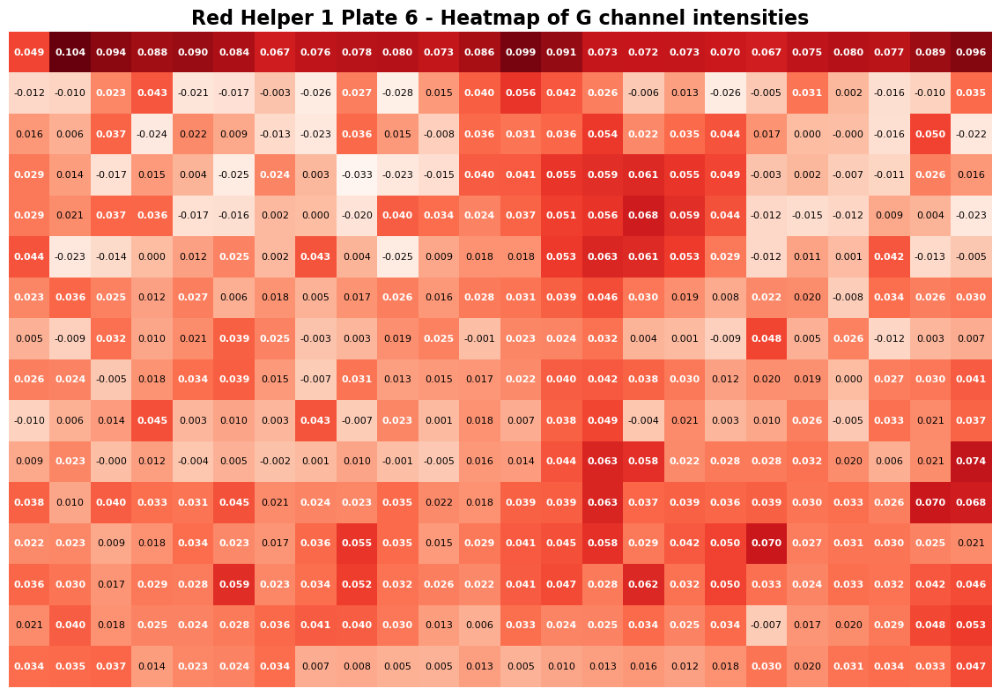

Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_OD_20260617_Red_35_Plate2_G.png


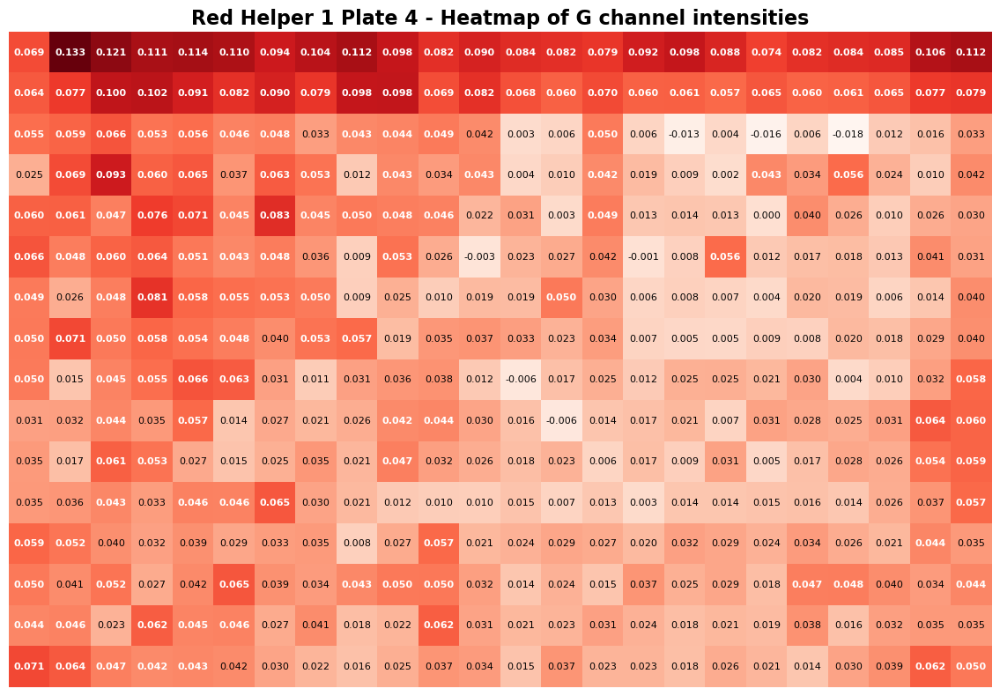

Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_OD_20260617_Red_35_Plate2_R.png


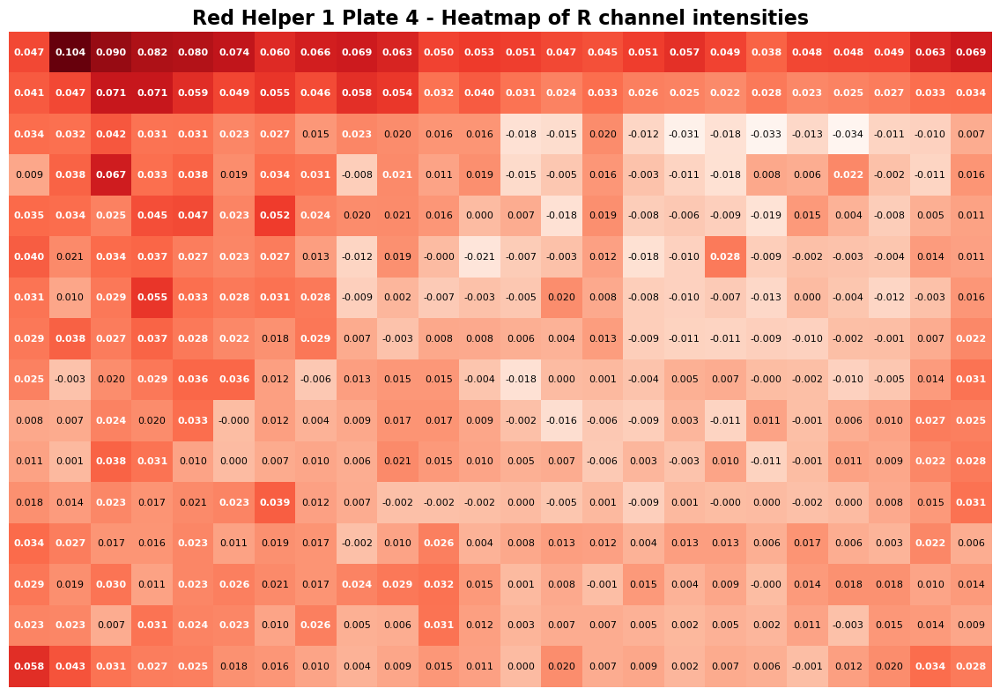

Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_OD_20260617_Red_67_Plate2_R.png


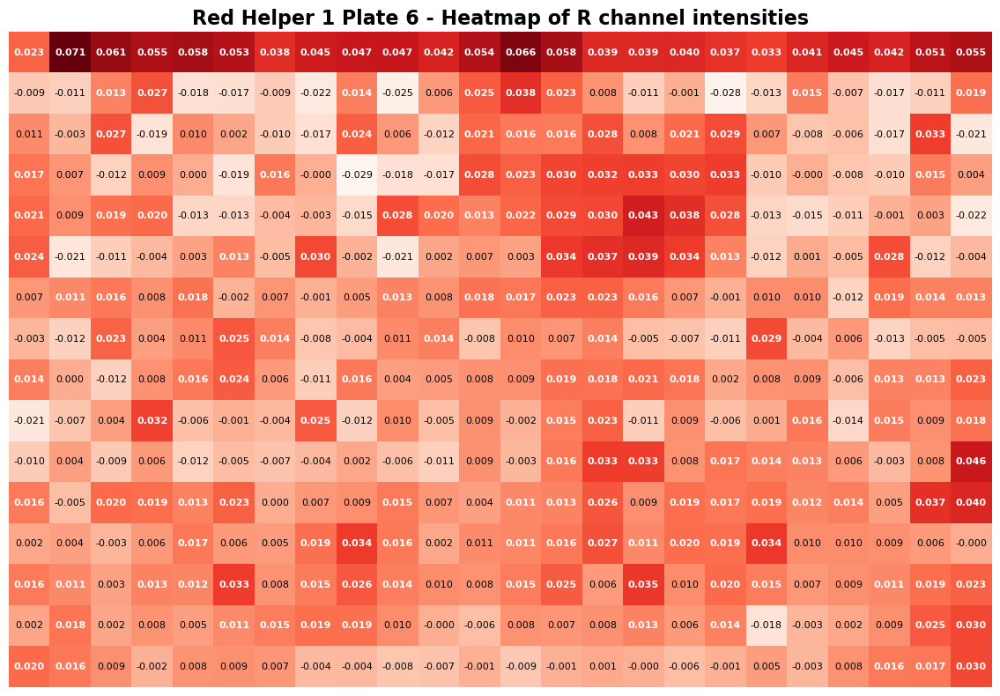

Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_OD_20260617_Red_67_Plate2_B.png


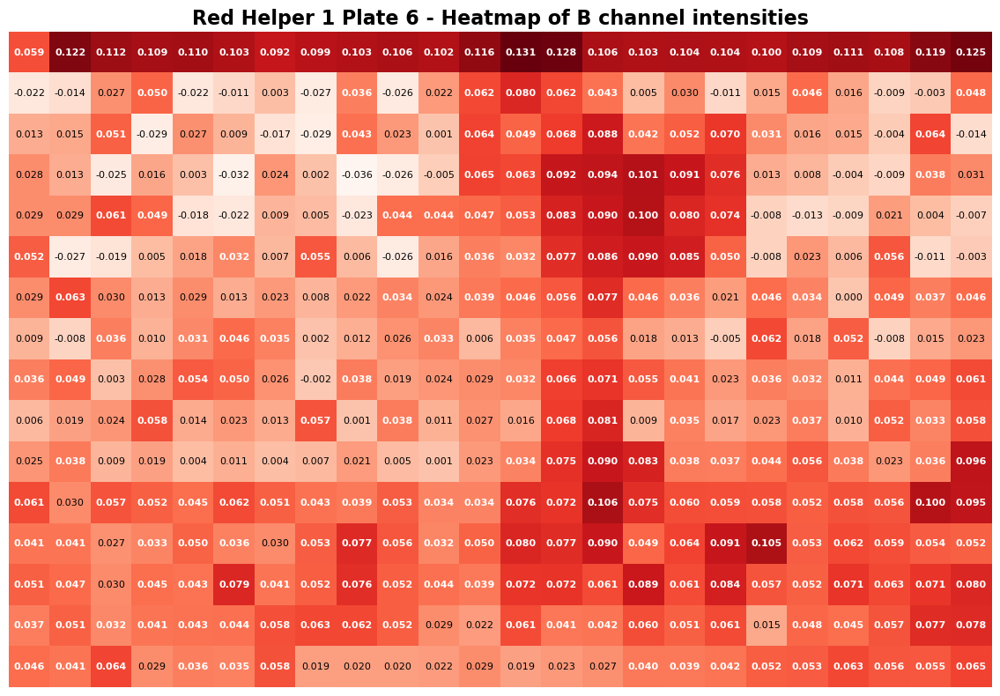

Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_OD_20260617_Red_35_Plate2_B.png


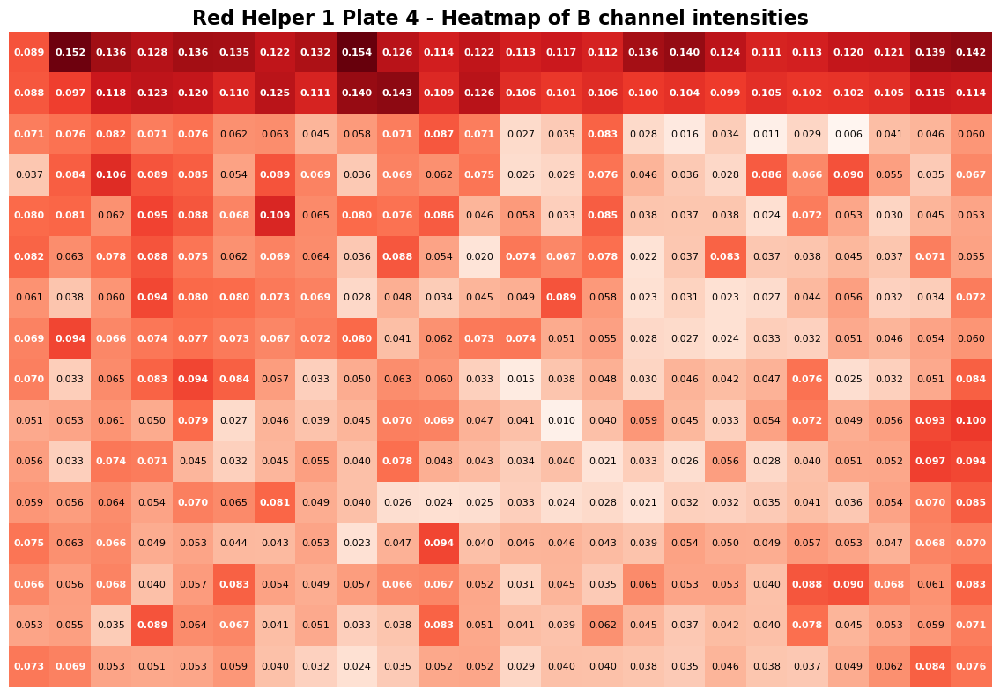

Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_OD_20260617_Red_35_Plate1_G.png


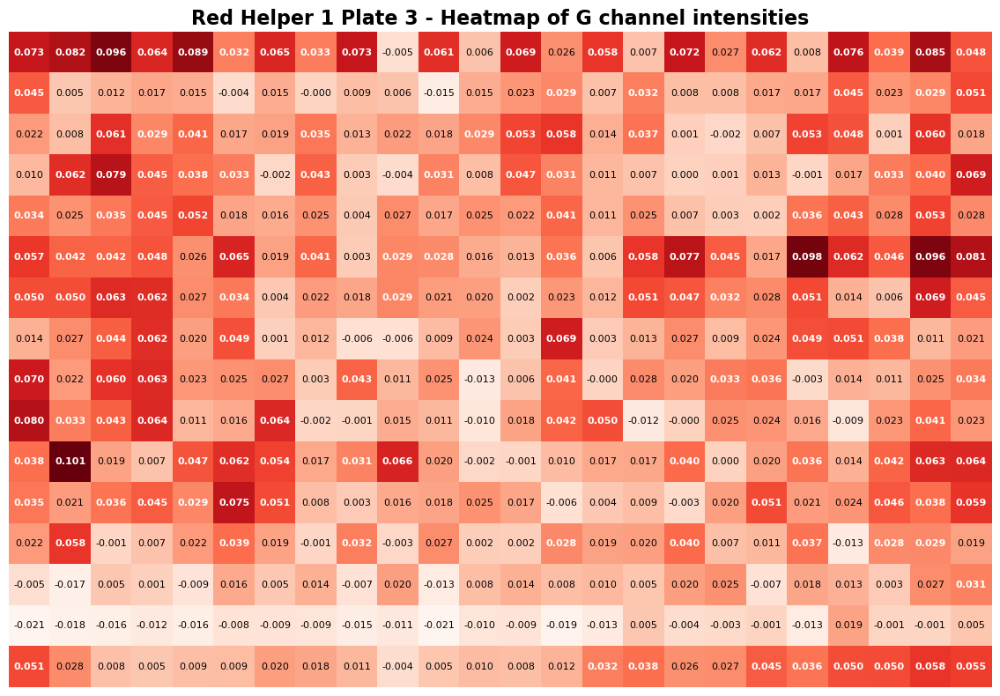

Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_OD_20260617_Red_67_Plate1_G.png


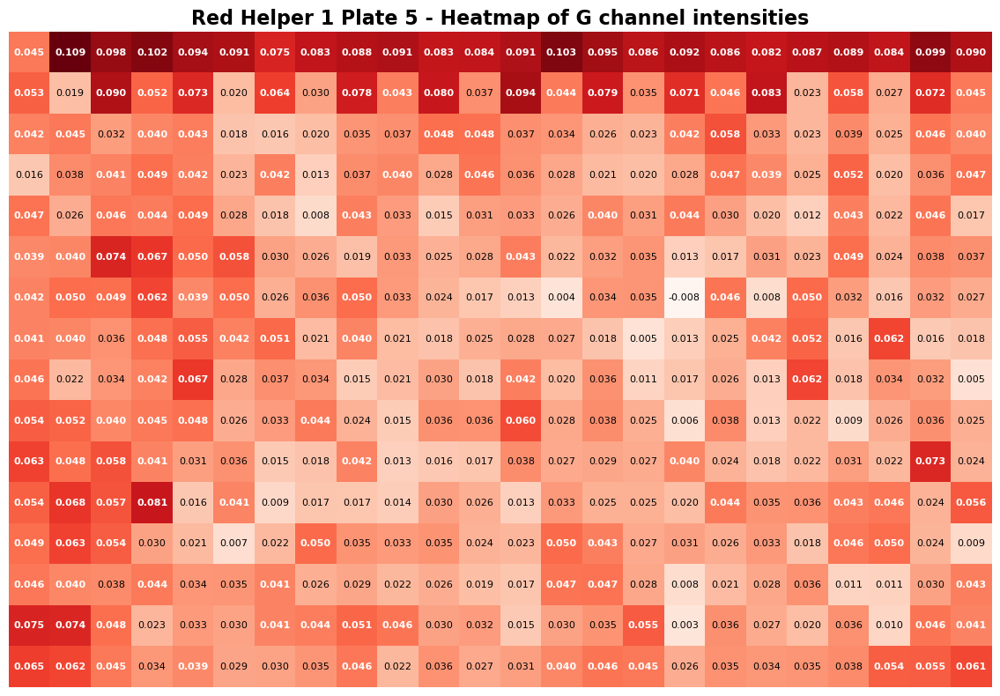

Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_OD_20260617_Red_67_Plate1_R.png


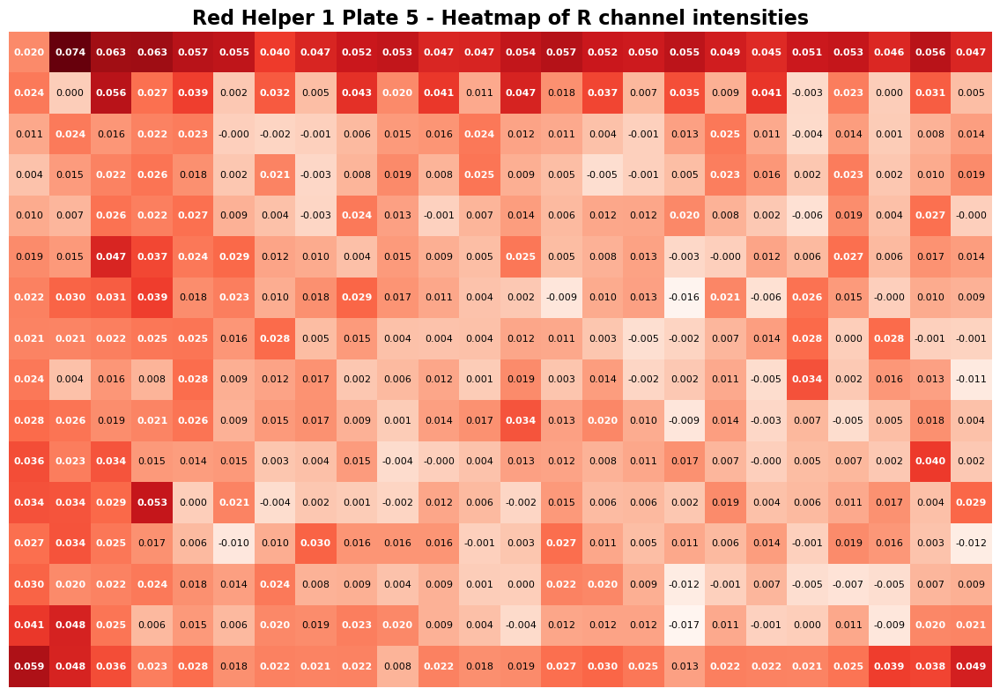

Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_OD_20260617_Red_35_Plate1_R.png


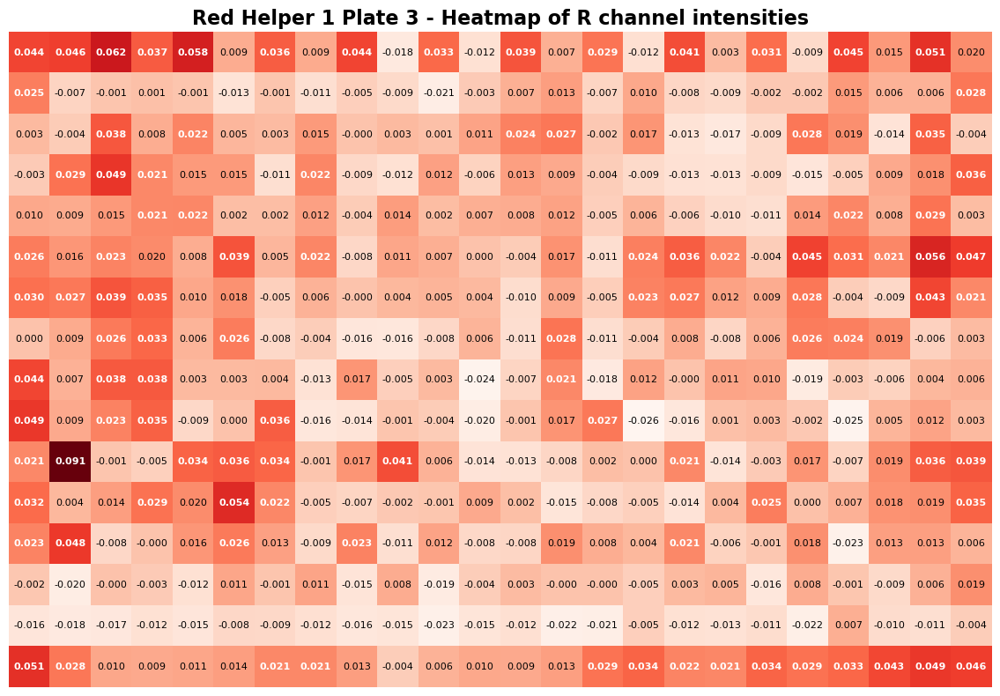

Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_OD_20260617_Red_35_Plate1_B.png


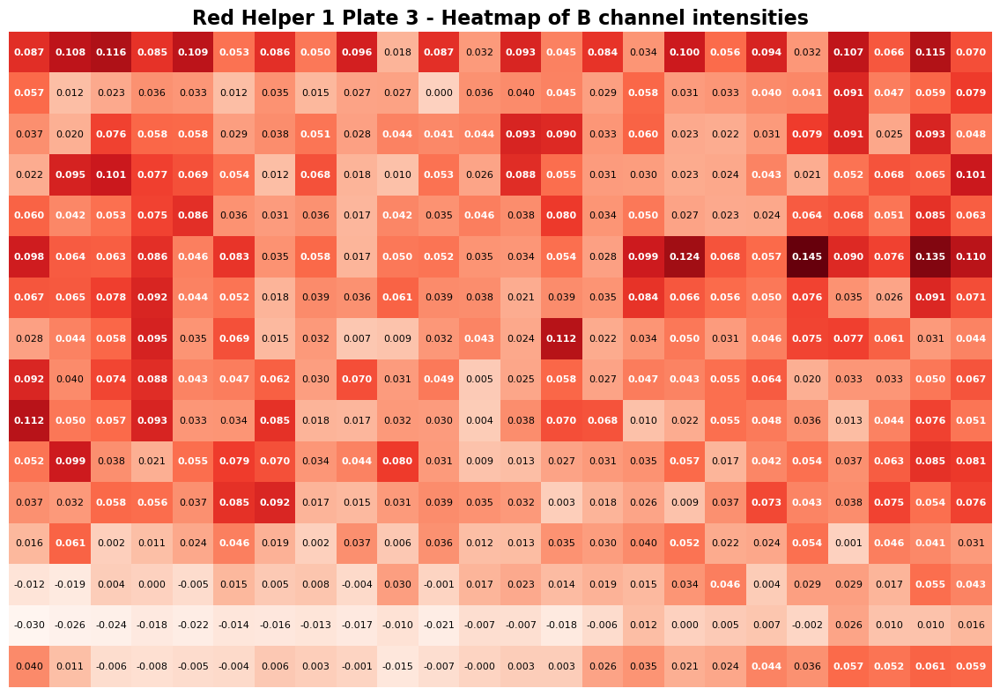

Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_OD_20260617_Red_67_Plate1_B.png


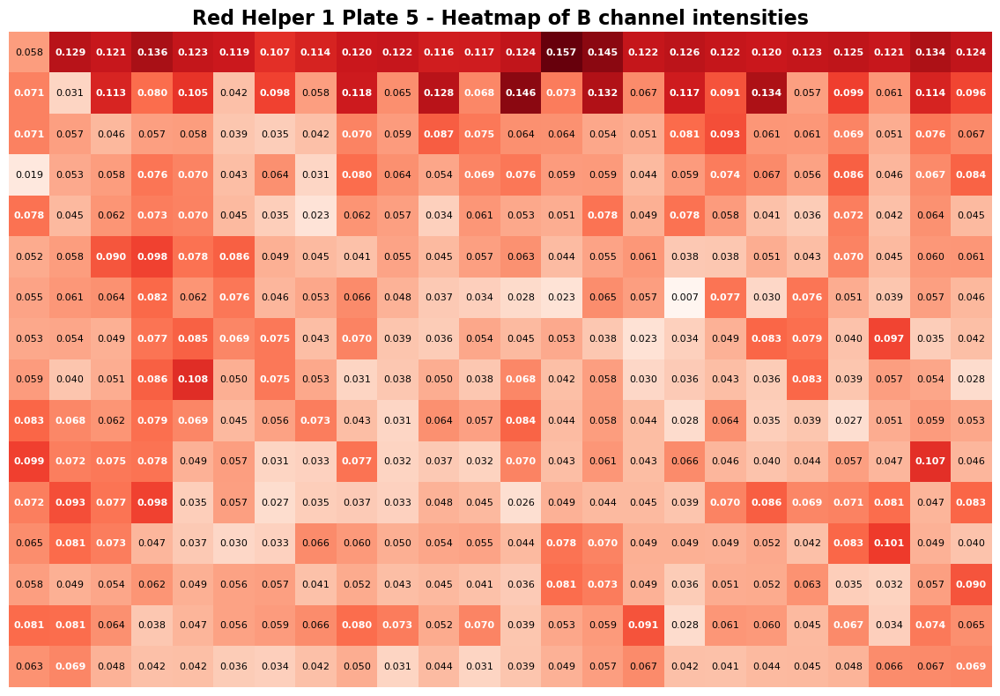

Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_OD_20260617_Red_12_Plate1_R.png


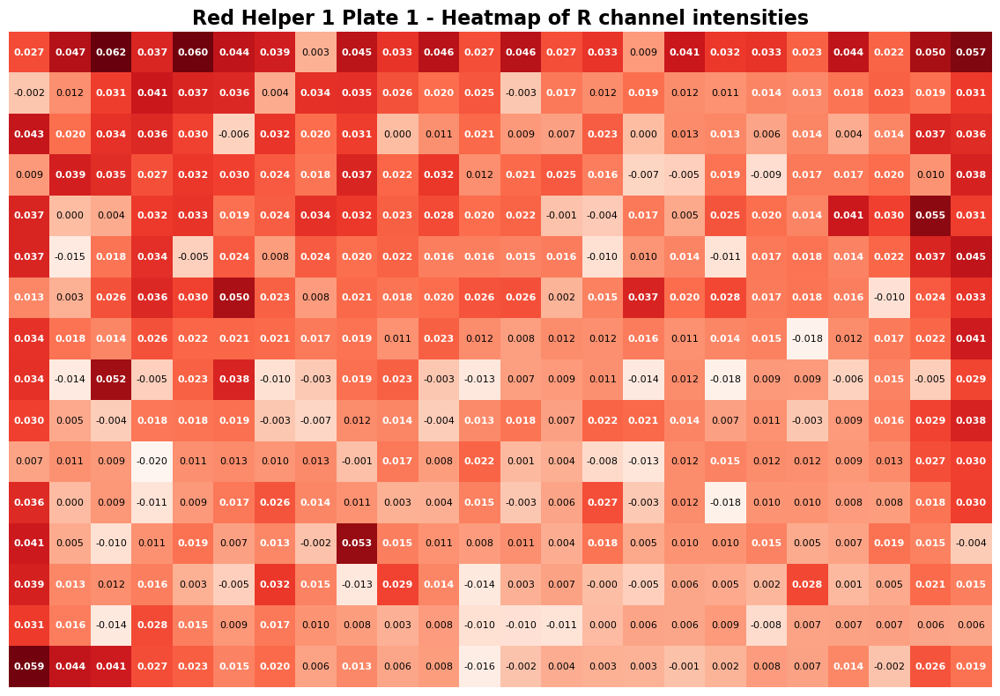

Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_OD_20260617_Red_12_Plate1_G.png


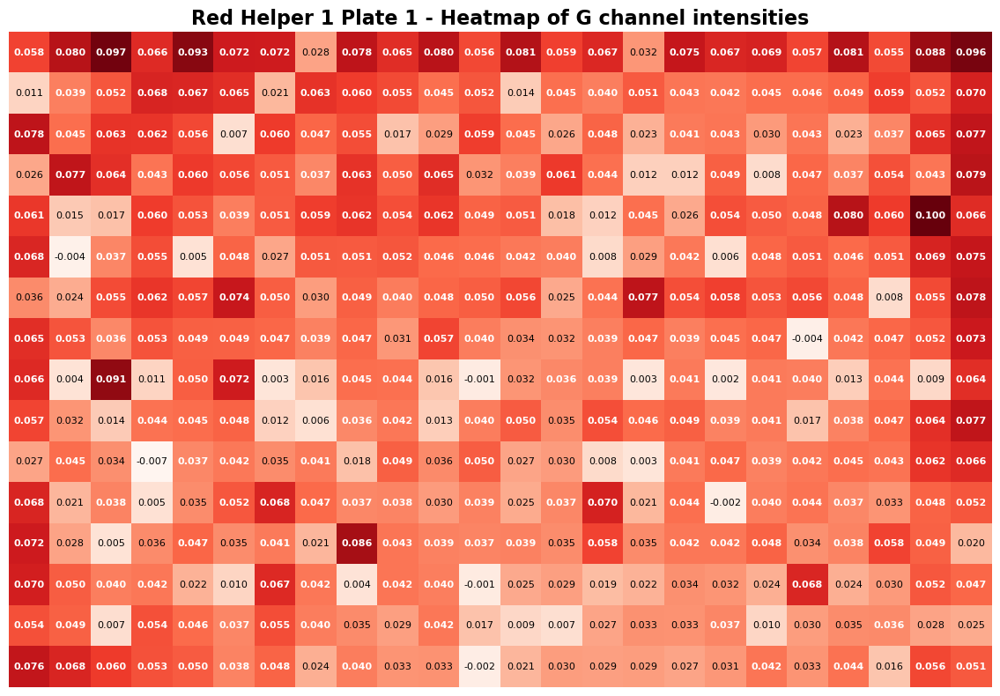

Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_OD_20260617_Red_12_Plate1_B.png


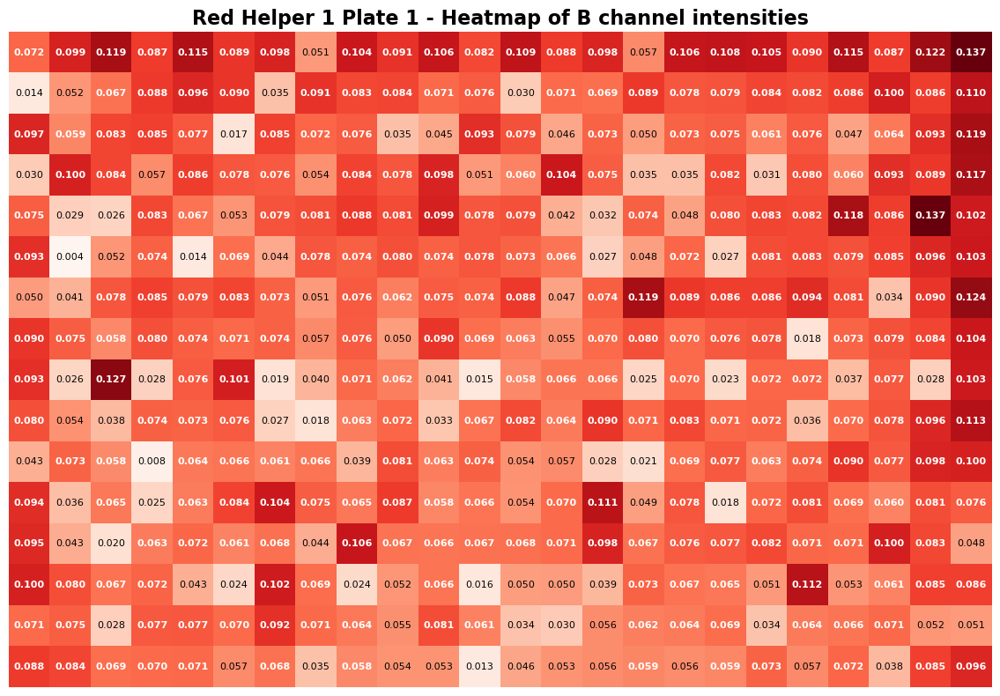

Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_OD_20260617_Red_12_Plate2_R.png


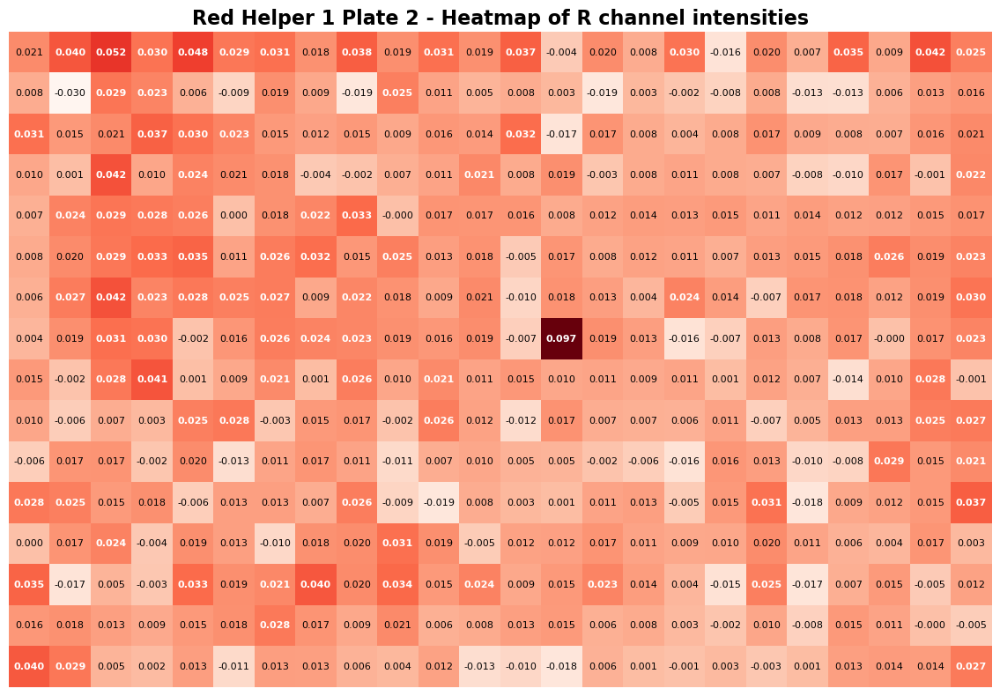

Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_OD_20260617_Red_12_Plate2_G.png


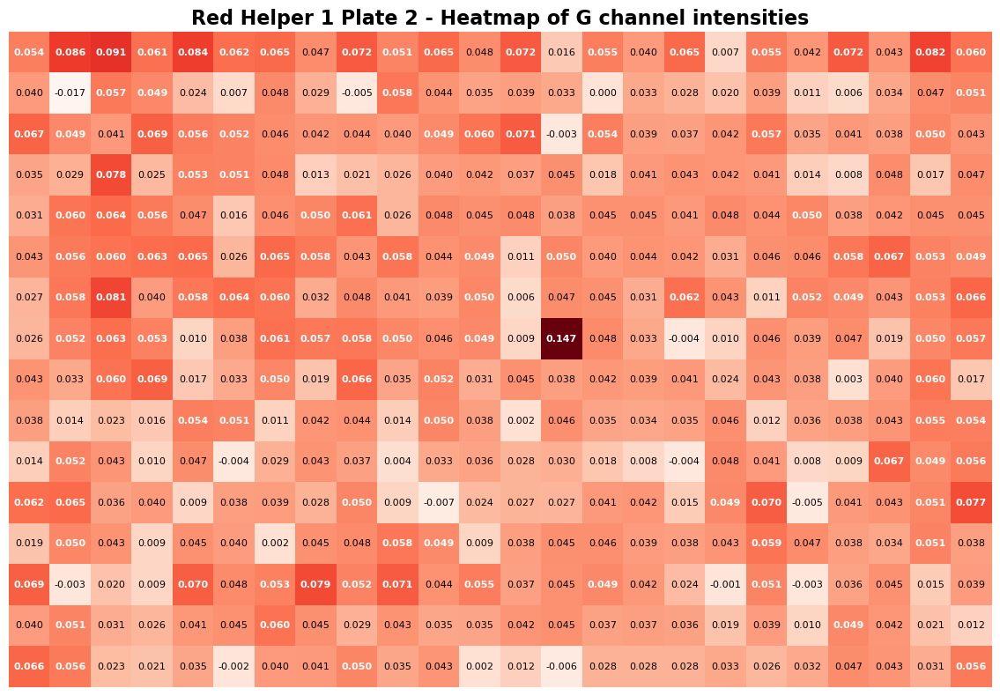

Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_OD_20260617_Red_12_Plate2_B.png


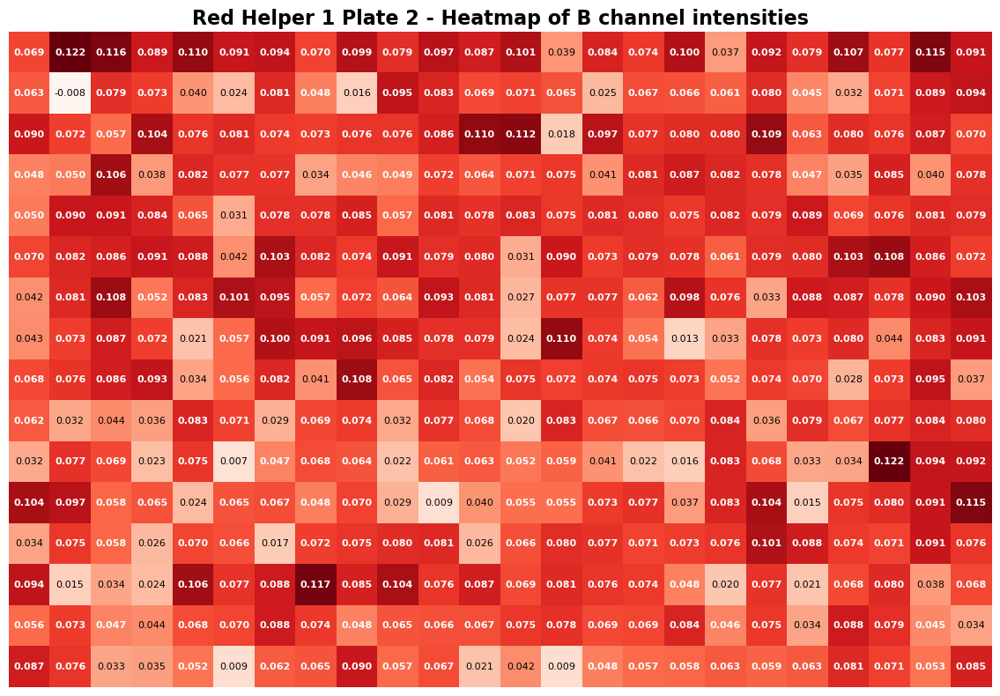

In [95]:
import glob
import os
import re

FOLDER = '/Users/astr/Documents/Pigments/ScanQuantif/OD_output'
MATCH_STRING = '0617'

files = glob.glob(f'{FOLDER}/*{MATCH_STRING}*.csv')

# e.g. 'OD_20260727_Red2_12_Plate1_G' -> ('12', '1')
def get_scan_plate(path):
    filename = os.path.splitext(os.path.basename(path))[0]
    match = re.search(r'_(\d+)_Plate(\d+)_', filename, re.IGNORECASE)
    return match.group(1), match.group(2)

unique_combos = sorted(set(get_scan_plate(f) for f in files), key=lambda c: (int(c[0]), int(c[1])))
plate_number = {combo: i + 1 for i, combo in enumerate(unique_combos)}

for path in files:
    filename = os.path.splitext(os.path.basename(path))[0]
    channel = filename[-1]
    plate_num = plate_number[get_scan_plate(path)]
    plot_plate_heatmap(path, title=f'Red Helper 1 Plate {plate_num} - Heatmap of {channel} channel intensities', data_type='OD')


Histogram saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Histogram_OD_20260727_Red2_12_Plate1.png


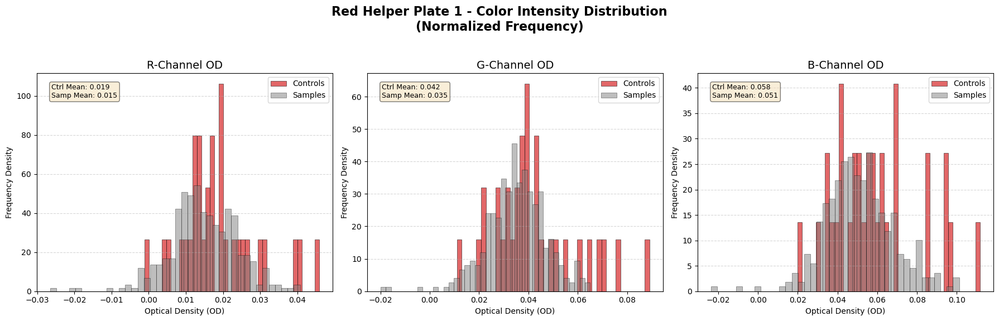

Histogram saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Histogram_OD_20260727_Red2_12_Plate2.png


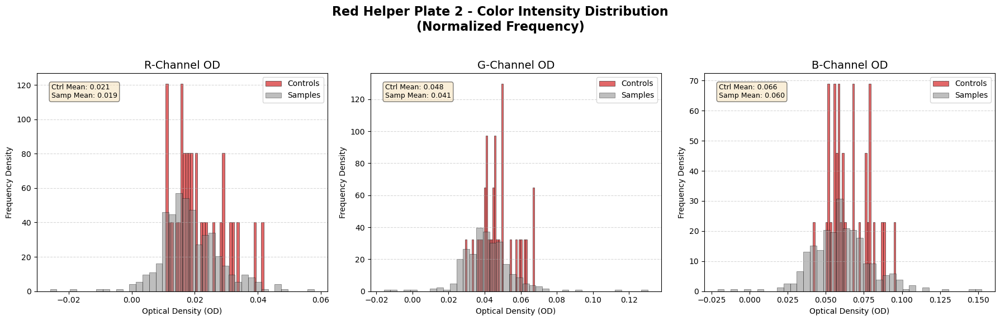

Histogram saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Histogram_OD_20260727_Red2_34_Plate1.png


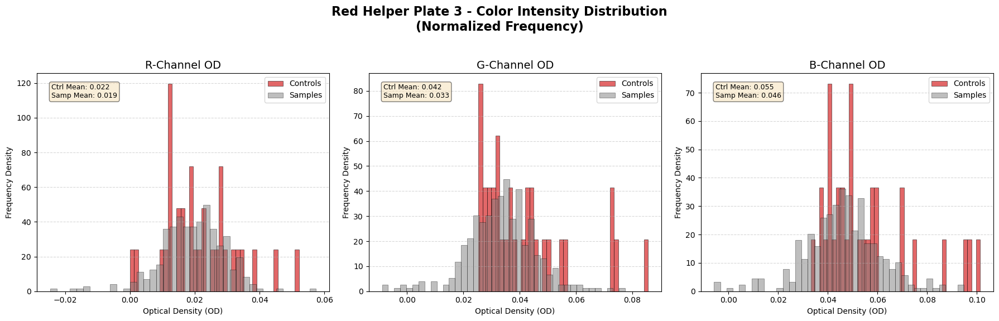

Histogram saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Histogram_OD_20260727_Red2_34_Plate2.png


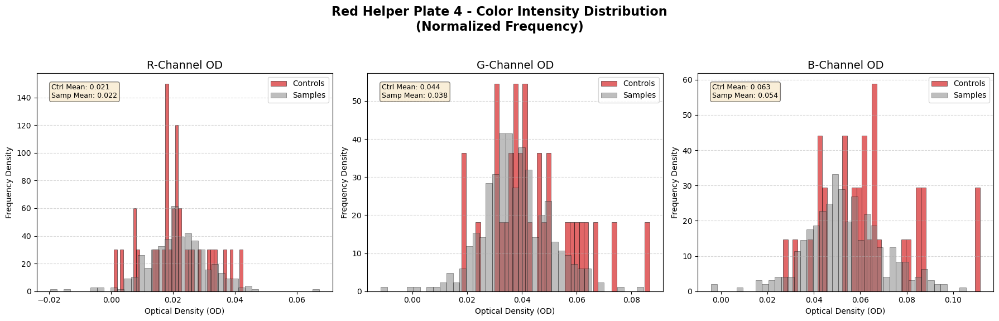

Histogram saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Histogram_OD_20260727_Red2_56_Plate1.png


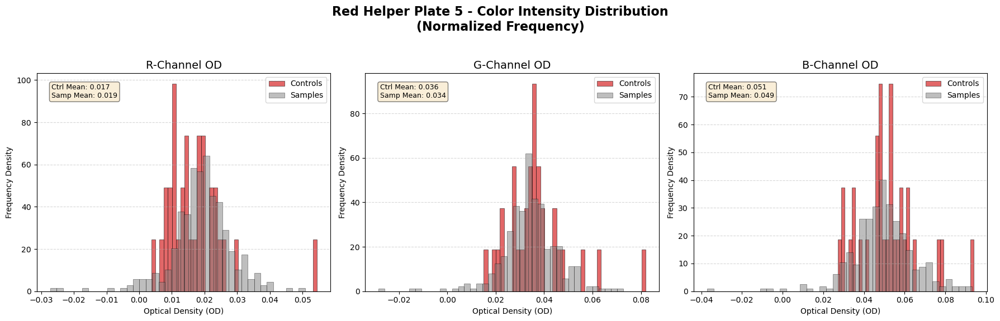

Histogram saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Histogram_OD_20260727_Red2_56_Plate2.png


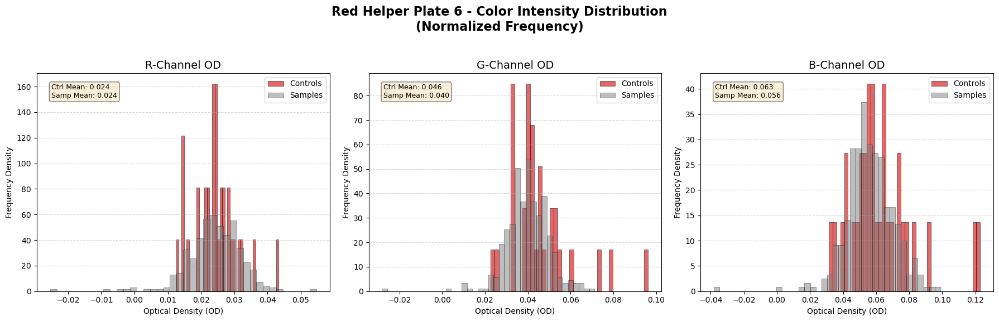

In [23]:
PREFIX_BASE = 'OD_20260727_Red2'
SCANS = ['12', '34', '56']
PLATES_LOCAL = ['1', '2']

global_plate = 0
for scan in SCANS:
    for plate_num in PLATES_LOCAL:
        global_plate += 1
        title = f'Red Helper Plate {global_plate} - Color Intensity Distribution\n(Normalized Frequency)'
        plot_od_histograms(f'{PREFIX_BASE}_{scan}', plate_num, layout_type='type_E', title=title)

Plotting histogram for all data! 

Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_OD_20260703_gradient_Plate2_R.png


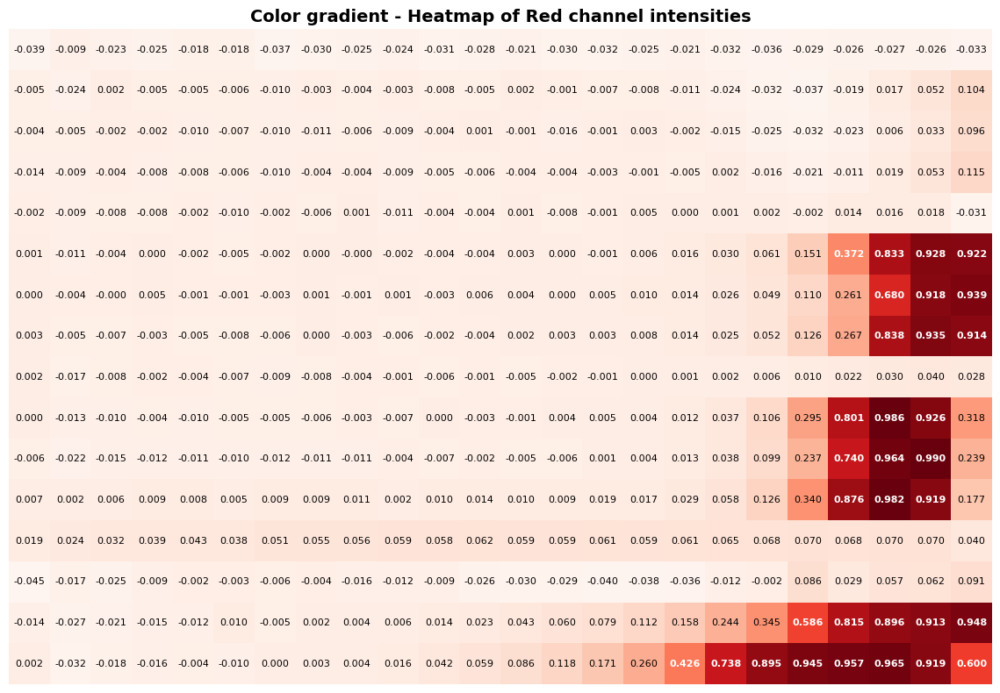

Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_OD_20260703_gradient_Plate2_G.png


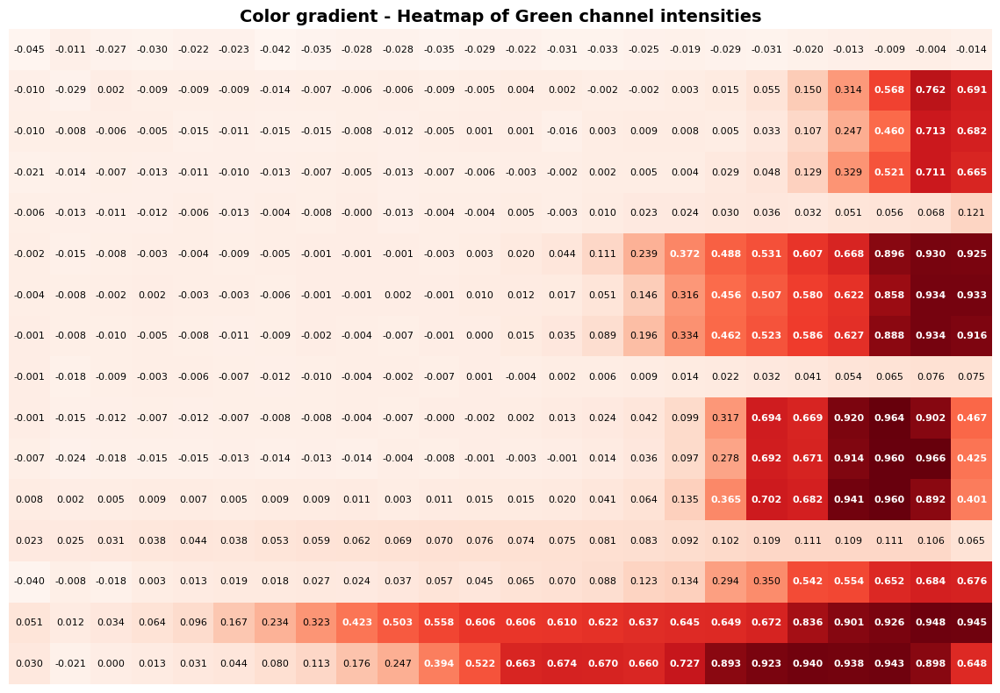

Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_OD_20260703_gradient_Plate2_B.png


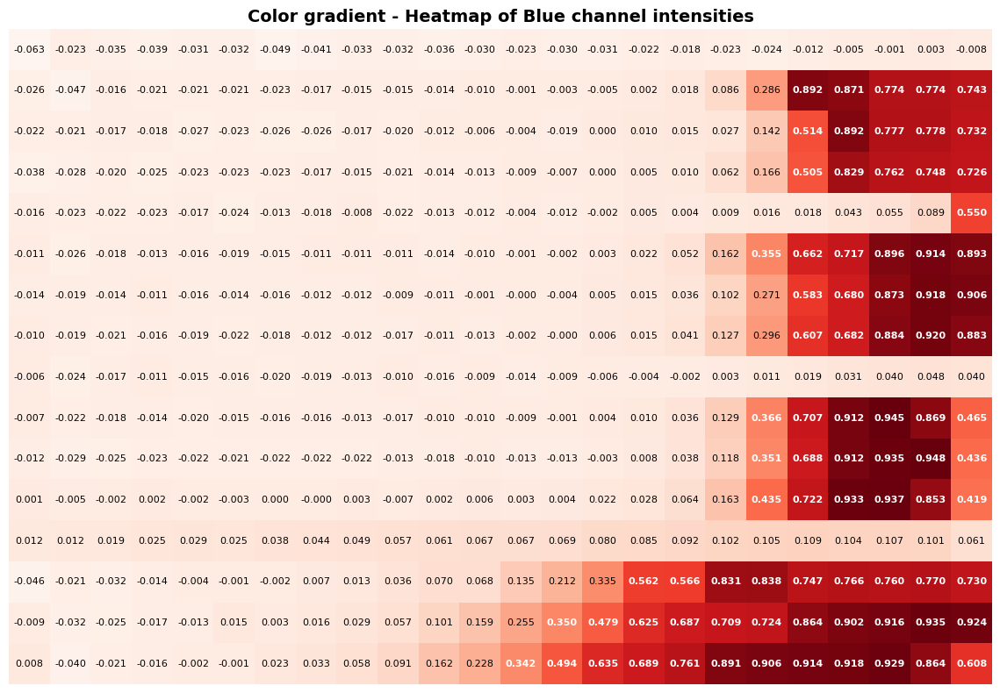

In [6]:
plot_plate_heatmap('/Users/astr/Documents/Pigments/ScanQuantif/OD_output/OD_20260703_gradient_Plate2_R.csv', 
                   title='Color gradient - Heatmap of Red channel intensities', data_type='OD')
plot_plate_heatmap('/Users/astr/Documents/Pigments/ScanQuantif/OD_output/OD_20260703_gradient_Plate2_G.csv', 
                   title='Color gradient - Heatmap of Green channel intensities',data_type='OD')
plot_plate_heatmap('/Users/astr/Documents/Pigments/ScanQuantif/OD_output/OD_20260703_gradient_Plate2_B.csv', 
                   title='Color gradient - Heatmap of Blue channel intensities',data_type='OD')


Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_I0_Matrix_R.png


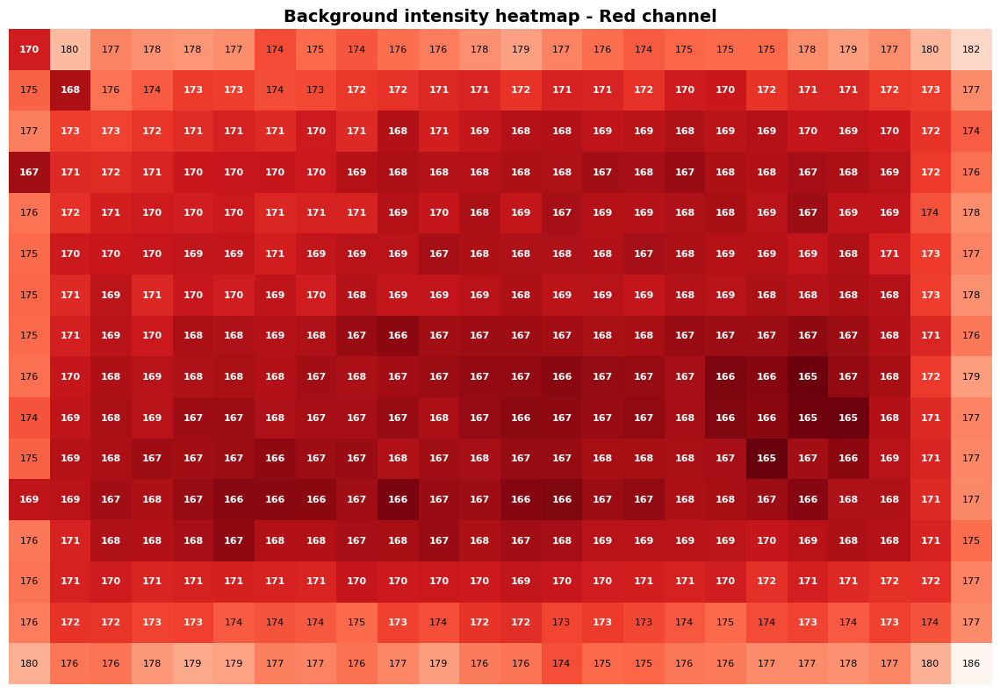

Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_I0_Matrix_G.png


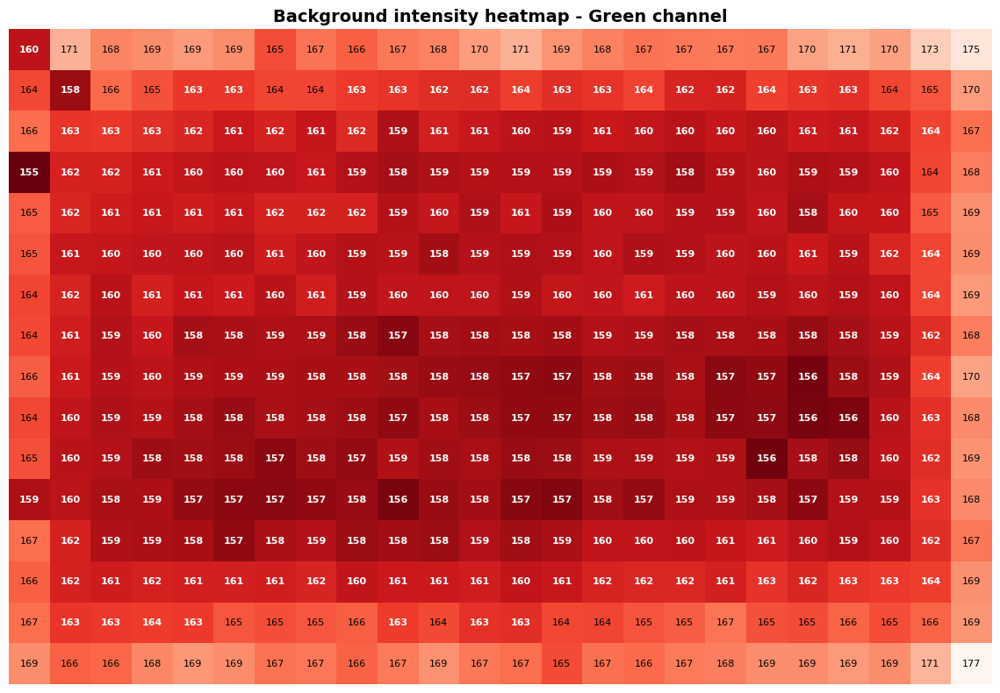

Heatmap saved: /Users/astr/Documents/Pigments/ScanQuantif/Graphs/Heatmap_I0_Matrix_B.png


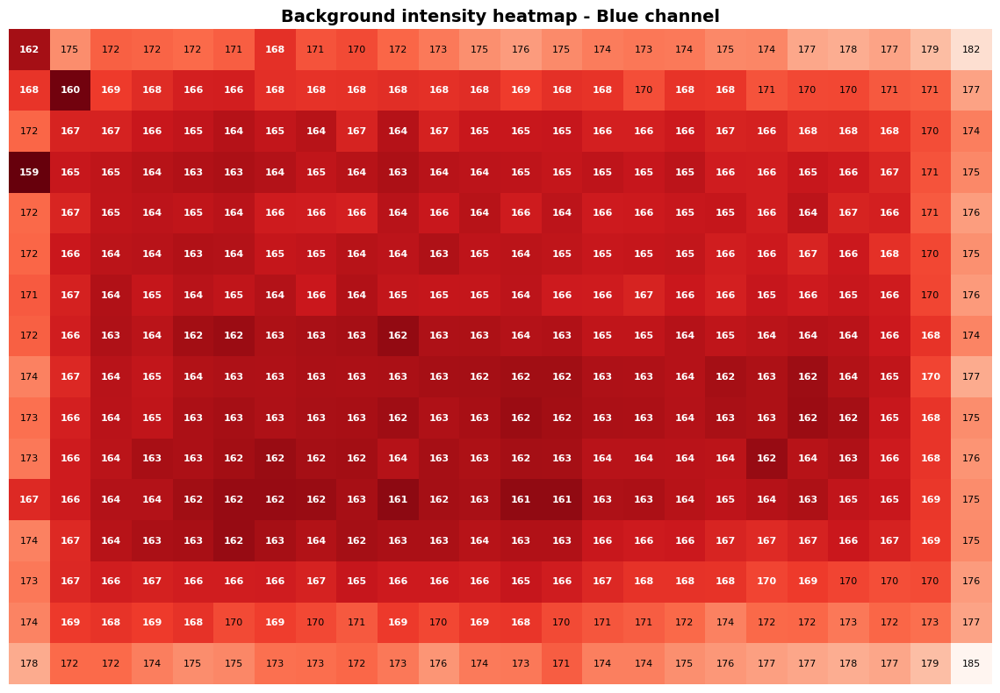

In [7]:
plot_plate_heatmap('/Users/astr/Documents/Pigments/ScanQuantif/Background_Matrices/I0_Matrix_R.csv', 
                   title='Background intensity heatmap - Red channel', data_type='RGB')
plot_plate_heatmap('/Users/astr/Documents/Pigments/ScanQuantif/Background_Matrices/I0_Matrix_G.csv',
                   title='Background intensity heatmap - Green channel', data_type='RGB')
plot_plate_heatmap('/Users/astr/Documents/Pigments/ScanQuantif/Background_Matrices/I0_Matrix_B.csv', 
                   title='Background intensity heatmap - Blue channel', data_type='RGB')


## Refining histogram plot function

In [96]:
def plot_od_histograms_channel(plate_specs, channel='G', layout_type='type_E',
                                data_dir='/Users/astr/Documents/Pigments/ScanQuantif/OD_output',
                                bins=40, title=None):
    """
    Plots normalized frequency histograms of a single OD channel across several
    plates, all sharing the same x/y axis scale.
    plate_specs: list of (od_file_prefix, plate_num) tuples.
    """
    tags = np.zeros(384, dtype=int)
    if layout_type == 'type_A':
        tags[0:24:2] = 1
    elif layout_type == 'type_B':
        tags[0:48] = 1
    elif layout_type == 'type_C':
        tags[0:24] = 1
        tags[24:48:2] = 1
    elif layout_type == 'type_D':
        tags[0:24] = 1
    elif layout_type == 'type_E':
        grid = tags.reshape(16, 24)
        grid[:, 11:13] = 1
        tags = grid.flatten()
    ctrl_mask, samp_mask = tags == 1, tags == 0

    fig, axes = plt.subplots(3, 2, figsize=(12, 15), sharex=True, sharey=True)
    axes = axes.flatten()

    fig.suptitle(title or f'Red Helper experiment - {channel}-Channel intensity distribution\n(Normalized Frequency)',
                 fontsize=18, fontweight='bold')

    for global_plate_num, (ax, (prefix, plate_num)) in enumerate(zip(axes, plate_specs), start=1):
        filename = f"{prefix}_Plate{plate_num}_{channel}.csv"
        filepath = os.path.join(data_dir, filename)
        try:
            data = pd.read_csv(filepath, header=None).to_numpy().flatten()
            controls = data[ctrl_mask][np.isfinite(data[ctrl_mask])]
            samples = data[samp_mask][np.isfinite(data[samp_mask])]

            ax.hist(controls, bins=bins, density=True, alpha=0.7, color='#d62728',
                    label='Controls', edgecolor='black', linewidth=0.5)
            ax.hist(samples, bins=bins, density=True, alpha=0.5, color='#7f7f7f',
                    label='Samples', edgecolor='black', linewidth=0.5)

            ax.set_title(f'Plate {global_plate_num}', fontsize=16)
            ax.set_xlabel('Color intensity')
            ax.grid(axis='y', linestyle='--', alpha=0.5)
            ax.legend(loc='upper right')
            ax.text(0.05, 0.95, f"Ctrl: {controls.mean():.3f}\nSamp: {samples.mean():.3f}",
                    transform=ax.transAxes, fontsize=9, va='top',
                    bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
        except FileNotFoundError:
            ax.text(0.5, 0.5, f"Missing:\n{filename}", ha='center', va='center', color='red')
            ax.set_title(f'Red Helper Plate {global_plate_num}', fontsize=16)
            ax.axis('off')

    axes[0].set_ylabel('Frequency Density')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

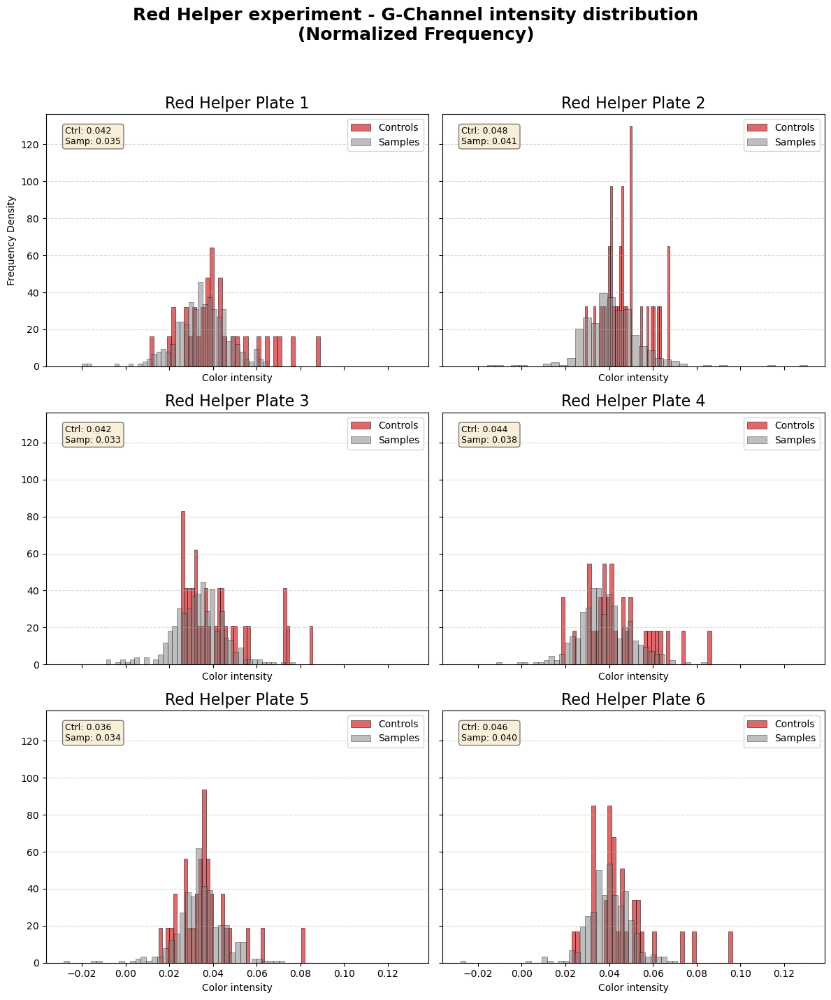

In [32]:
plate_specs = [(f'OD_20260727_Red2_{scan}', p) for scan in ['12', '34', '56'] for p in ['1', '2']]
plot_od_histograms_channel(plate_specs, channel='G', layout_type='type_E')

# Statistical analysis

First, let's look at our data: 
- some distributions are skewed, even though most of them have kind of a normal shape
- we want to compare 2 groups of different sizes
- the variance seems to be in the same ranges

We could go for a 
- Welch's t-test (t-test not assuming equal variance)
- Mann Whitney test (do not assume normality, handles unbalanced group sizes fine)

In [33]:
import os
import numpy as np
import pandas as pd
from scipy.stats import mannwhitneyu

# --- CONFIG ---
CHANNEL = 'G'
LAYOUT_TYPE = 'type_E'
DATA_DIR = '/Users/astr/Documents/Pigments/ScanQuantif/OD_output'

# same plate_specs structure as before: [(od_file_prefix, local_plate_num), ...]
plate_specs = [(f'OD_20260727_Red2_{scan}', p) for scan in ['12', '34', '56'] for p in ['1', '2']]

# --- CONTROL/SAMPLE MASK (same logic as plot_od_histograms_channel) ---
tags = np.zeros(384, dtype=int)
grid = tags.reshape(16, 24)
grid[:, 11:13] = 1
tags = grid.flatten()
ctrl_mask, samp_mask = tags == 1, tags == 0

# --- MANN-WHITNEY PER PLATE ---
results = []
for global_plate_num, (prefix, plate_num) in enumerate(plate_specs, start=1):
    filepath = os.path.join(DATA_DIR, f"{prefix}_Plate{plate_num}_{CHANNEL}.csv")
    data = pd.read_csv(filepath, header=None).to_numpy().flatten()

    controls = data[ctrl_mask][np.isfinite(data[ctrl_mask])]
    samples = data[samp_mask][np.isfinite(data[samp_mask])]

    u_stat, p_value = mannwhitneyu(controls, samples, alternative='two-sided')
    rank_biserial = 1 - (2 * u_stat) / (len(controls) * len(samples))

    results.append({
        'plate': global_plate_num,
        'n_controls': len(controls),
        'n_samples': len(samples),
        'ctrl_median': np.median(controls),
        'samp_median': np.median(samples),
        'U': u_stat,
        'p_value': p_value,
        'rank_biserial': rank_biserial,
    })

results_df = pd.DataFrame(results)
print(results_df.to_string(index=False))

 plate  n_controls  n_samples  ctrl_median  samp_median      U  p_value  rank_biserial
     1          32        352     0.038665     0.035130 6888.0 0.036754      -0.223011
     2          32        352     0.046005     0.040233 7531.0 0.001588      -0.337180
     3          32        352     0.036004     0.034061 7035.0 0.019648      -0.249112
     4          32        352     0.040803     0.036718 6955.0 0.027812      -0.234908
     5          32        352     0.035417     0.033836 5998.0 0.543190      -0.064986
     6          32        352     0.042238     0.040147 6726.0 0.068911      -0.194247


In [38]:
import os
import numpy as np
import pandas as pd
from scipy.stats import ttest_ind

# --- CONFIG ---
CHANNEL = 'G'
LAYOUT_TYPE = 'type_E'
DATA_DIR = '/Users/astr/Documents/Pigments/ScanQuantif/OD_output'

plate_specs = [(f'OD_20260727_Red2_{scan}', p) for scan in ['12', '34', '56'] for p in ['1', '2']]

tags = np.zeros(384, dtype=int)
grid = tags.reshape(16, 24)
grid[:, 11:13] = 1
tags = grid.flatten()
ctrl_mask, samp_mask = tags == 1, tags == 0

results = []
for global_plate_num, (prefix, plate_num) in enumerate(plate_specs, start=1):
    filepath = os.path.join(DATA_DIR, f"{prefix}_Plate{plate_num}_{CHANNEL}.csv")
    data = pd.read_csv(filepath, header=None).to_numpy().flatten()

    controls = data[ctrl_mask][np.isfinite(data[ctrl_mask])]
    samples = data[samp_mask][np.isfinite(data[samp_mask])]

    t_stat, p_value = ttest_ind(controls, samples, equal_var=False)

    results.append({
        'plate': global_plate_num,
        'n_controls': len(controls),
        'n_samples': len(samples),
        'ctrl_mean': controls.mean(),
        'samp_mean': samples.mean(),
        't_stat': t_stat,
        'p_value': p_value,
    })

results_df = pd.DataFrame(results)
print(results_df.to_string(index=False))

 plate  n_controls  n_samples  ctrl_mean  samp_mean   t_stat  p_value
     1          32        352   0.042460   0.034948 2.390928 0.022532
     2          32        352   0.047501   0.041387 3.291970 0.001968
     3          32        352   0.041585   0.033490 2.818764 0.007946
     4          32        352   0.044232   0.037783 2.289723 0.028228
     5          32        352   0.036412   0.034061 0.994258 0.326818
     6          32        352   0.045615   0.039933 2.097807 0.043515


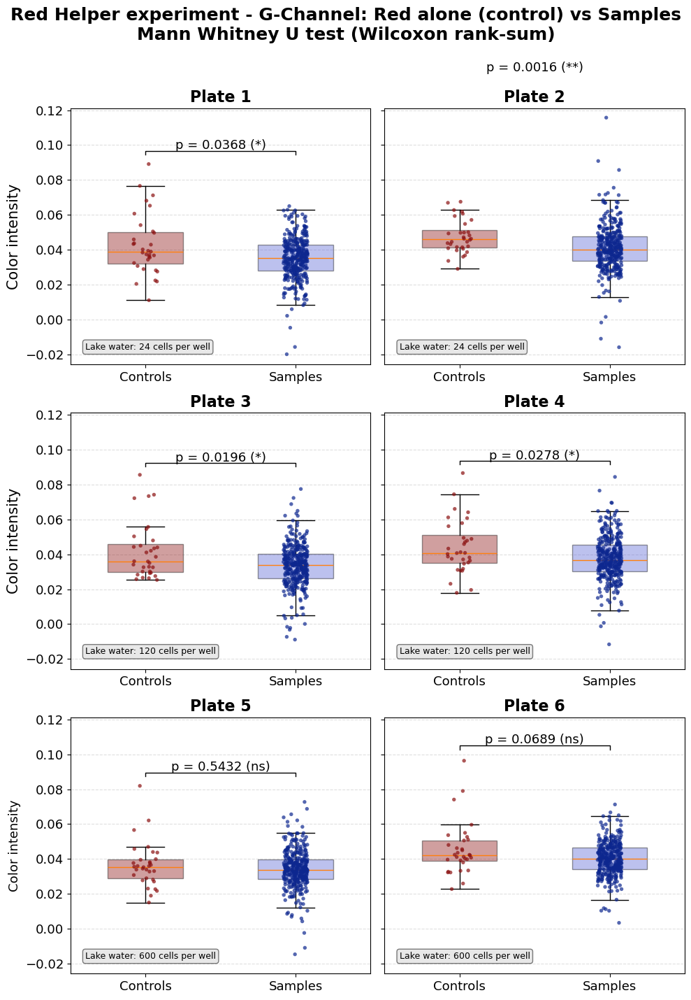

In [55]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

# --- CONFIG ---
CHANNEL = 'G'
LAYOUT_TYPE = 'type_E'
DATA_DIR = '/Users/astr/Documents/Pigments/ScanQuantif/OD_output'
CONCENTRATION_BY_PLATE = {
    1: 24, 2: 24,
    3: 120, 4: 120,
    5: 600, 6: 600,
}

plate_specs = [(f'OD_20260727_Red2_{scan}', p) for scan in ['12', '34', '56'] for p in ['1', '2']]

# --- CONTROL/SAMPLE MASK ---
tags = np.zeros(384, dtype=int)
grid = tags.reshape(16, 24)
grid[:, 11:13] = 1
tags = grid.flatten()
ctrl_mask, samp_mask = tags == 1, tags == 0


def significance_stars(p):
    if p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    return 'ns'


# --- PLOT ---
fig, axes = plt.subplots(3, 2, figsize=(10, 15), sharey=True)
axes = axes.flatten()

fig.suptitle(f'Red Helper experiment - {CHANNEL}-Channel: Red alone (control) vs Samples\nMann Whitney U test (Wilcoxon rank-sum)',
             fontsize=18, fontweight='bold')

for global_plate_num, (ax, (prefix, plate_num)) in enumerate(zip(axes, plate_specs), start=1):
    filepath = os.path.join(DATA_DIR, f"{prefix}_Plate{plate_num}_{CHANNEL}.csv")
    data = pd.read_csv(filepath, header=None).to_numpy().flatten()

    controls = data[ctrl_mask][np.isfinite(data[ctrl_mask])]
    samples = data[samp_mask][np.isfinite(data[samp_mask])]

    _, p_value = mannwhitneyu(controls, samples, alternative='two-sided')

    # Boxplot
    bp = ax.boxplot([controls, samples], positions=[1, 2], widths=0.5,
                     patch_artist=True, showfliers=False)
    for patch, color in zip(bp['boxes'], ["#8a1010b9", "#5964d5"]):
        patch.set_facecolor(color)
        patch.set_alpha(0.4)

    # Jittered dots per well
    rng = np.random.default_rng(0)
    for x, group, color in [(1, controls, "#8a1010"), (2, samples, "#0D278F")]:
        jitter = rng.uniform(-0.08, 0.08, size=len(group))
        ax.scatter(np.full(len(group), x) + jitter, group, color=color,
           edgecolor='none', s=15, alpha=0.7, zorder=3)

    ax.set_xticks([1, 2])
    ax.set_xticklabels(['Controls', 'Samples'])
    ax.set_title(f'Plate {global_plate_num}', fontsize=16, fontweight='bold')
    ax.tick_params(axis='x', labelsize=13)
    ax.tick_params(axis='y', labelsize=13)
    ax.grid(axis='y', linestyle='--', alpha=0.4)

    # p-value annotation
    stars = significance_stars(p_value)
    y_max = max(controls.max(), samples.max())
    y_range = y_max - min(controls.min(), samples.min())
    y_annot = y_max + 0.05 * y_range
    ax.plot([1, 1, 2, 2], [y_annot, y_annot + 0.02 * y_range, y_annot + 0.02 * y_range, y_annot],
            color='black', linewidth=1)
    ax.text(1.5, y_annot + 0.03 * y_range, f'p = {p_value:.4f} ({stars})',
            ha='center', fontsize=13)
    ax.set_ylim(top=y_annot + 0.15 * y_range)

    # Display lake water concentration
    conc = CONCENTRATION_BY_PLATE[global_plate_num]
    ax.text(0.05, 0.05, f'Lake water: {conc} cells per well',
            transform=ax.transAxes, fontsize=9, va='bottom', ha='left',
            bbox=dict(boxstyle='round', facecolor='lightgrey', alpha=0.5))

axes[0].set_ylabel('Color intensity', fontsize=15)
axes[2].set_ylabel('Color intensity', fontsize=15)
axes[4].set_ylabel('Color intensity', fontsize=13)

plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.show()

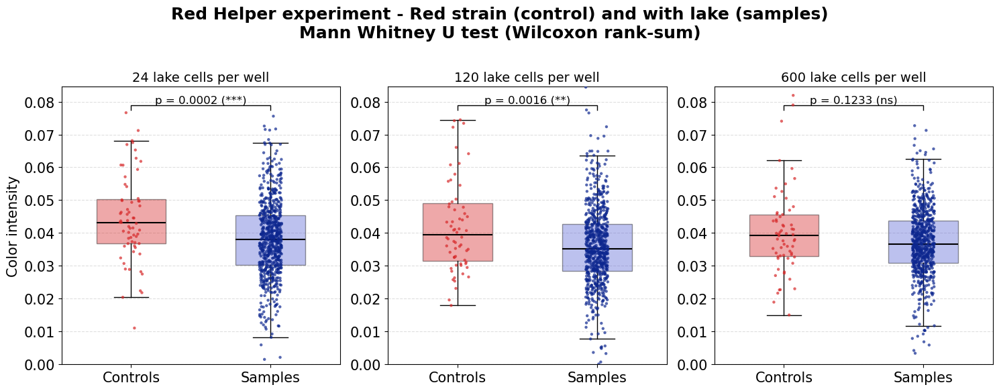

In [64]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

# --- CONFIG ---
CHANNEL = 'G'
LAYOUT_TYPE = 'type_E'
DATA_DIR = '/Users/astr/Documents/Pigments/ScanQuantif/OD_output'

# Grouped by concentration: each group merges 2 plates
plate_specs = [(f'OD_20260727_Red2_{scan}', p) for scan in ['12', '34', '56'] for p in ['1', '2']]
concentration_groups = [plate_specs[0:2], plate_specs[2:4], plate_specs[4:6]]
concentrations = [24, 120, 600]

tags = np.zeros(384, dtype=int)
grid = tags.reshape(16, 24)
grid[:, 11:13] = 1
tags = grid.flatten()
ctrl_mask, samp_mask = tags == 1, tags == 0


def significance_stars(p):
    if p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    return 'ns'


# --- PASS 1: load and merge per concentration group, compute p-values and shared y-range ---
group_data = []
all_values = []
for group_specs, conc in zip(concentration_groups, concentrations):
    controls_pooled, samples_pooled = [], []
    for prefix, plate_num in group_specs:
        filepath = os.path.join(DATA_DIR, f"{prefix}_Plate{plate_num}_{CHANNEL}.csv")
        data = pd.read_csv(filepath, header=None).to_numpy().flatten()
        controls_pooled.extend(data[ctrl_mask][np.isfinite(data[ctrl_mask])])
        samples_pooled.extend(data[samp_mask][np.isfinite(data[samp_mask])])

    controls_pooled = np.array(controls_pooled)
    samples_pooled = np.array(samples_pooled)
    _, p_value = mannwhitneyu(controls_pooled, samples_pooled, alternative='two-sided')
    group_data.append((controls_pooled, samples_pooled, p_value, conc))
    all_values.extend(controls_pooled)
    all_values.extend(samples_pooled)

y_top = np.percentile(all_values, 99)
y_bottom = min(0, np.percentile(all_values, 1))
y_range = y_top - y_bottom
y_annot = y_top + 0.08 * y_range

# --- PASS 2: plot ---
fig, axes = plt.subplots(1, 3, figsize=(15, 6), sharey=True)
fig.suptitle(f'Red Helper experiment - Red strain (control) and with lake (samples)\nMann Whitney U test (Wilcoxon rank-sum)',
             fontsize=18, fontweight='bold', y=0.995)

rng = np.random.default_rng(0)
for ax, (controls, samples, p_value, conc) in zip(axes, group_data):
    bp = ax.boxplot([controls, samples], positions=[1, 2], widths=0.5,
                     patch_artist=True, showfliers=False, medianprops=dict(color='black', linewidth=1.5))
    for patch, color in zip(bp['boxes'], ['#d62728', '#5964d5']):
        patch.set_facecolor(color)
        patch.set_alpha(0.4)

    for x, group, color in [(1, controls, '#d62728'), (2, samples, '#0D278F')]:
        jitter = rng.uniform(-0.08, 0.08, size=len(group))
        ax.scatter(np.full(len(group), x) + jitter, group, color=color,
                   edgecolor='none', s=10, alpha=0.7, zorder=3)

    ax.set_xticks([1, 2])
    ax.set_xticklabels(['Controls', 'Samples'])
    ax.set_title(f'{conc} lake cells per well', fontsize=14)
    ax.grid(axis='y', linestyle='--', alpha=0.4)
    ax.tick_params(axis='y', labelsize=15, labelleft=True)
    ax.tick_params(axis='x', labelsize=15, labelleft=True)

    stars = significance_stars(p_value)
    ax.plot([1, 1, 2, 2], [y_annot, y_annot + 0.02 * y_range, y_annot + 0.02 * y_range, y_annot],
            color='black', linewidth=1)
    ax.text(1.5, y_annot + 0.03 * y_range, f'p = {p_value:.4f} ({stars})', ha='center', fontsize=12)

axes[0].set_ylim(y_bottom, y_annot + 0.1 * y_range)
axes[0].set_ylabel('Color intensity', fontsize=15)

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

p = 0.0008, effect size (r) = -0.158
p = 0.0000, effect size (r) = -0.275
p = 0.0000, effect size (r) = -0.205


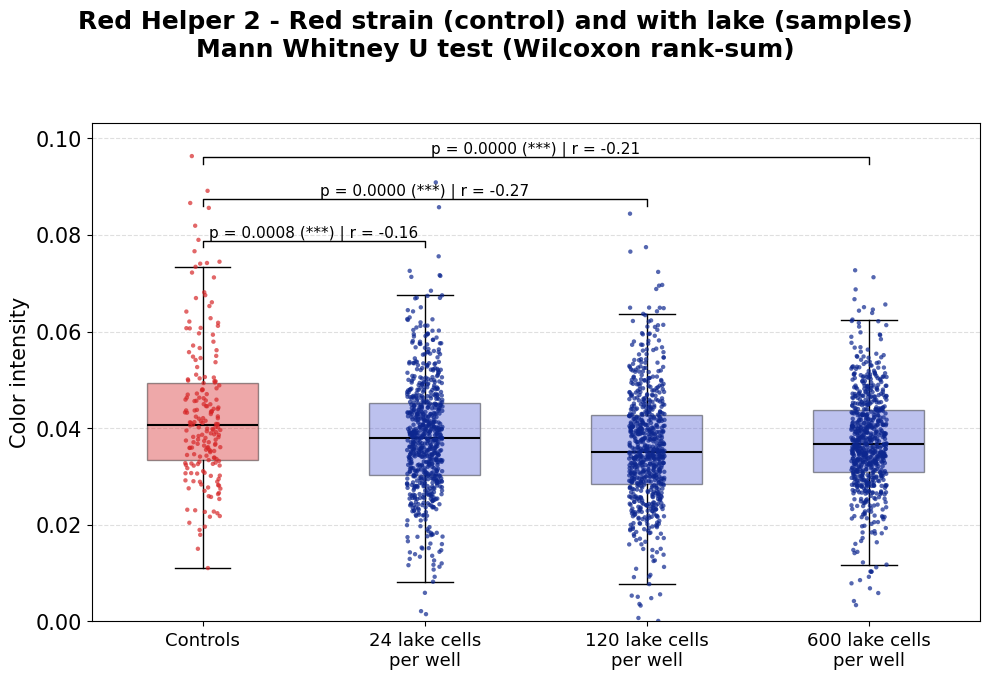

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

# --- CONFIG ---
CHANNEL = 'G'
LAYOUT_TYPE = 'type_E'
DATA_DIR = '/Users/astr/Documents/Pigments/ScanQuantif/OD_output'

plate_specs = [(f'OD_20260727_Red2_{scan}', p) for scan in ['12', '34', '56'] for p in ['1', '2']]
concentration_groups = [plate_specs[0:2], plate_specs[2:4], plate_specs[4:6]]
concentrations = [24, 120, 600]

tags = np.zeros(384, dtype=int)
grid = tags.reshape(16, 24)
grid[:, 11:13] = 1
tags = grid.flatten()
ctrl_mask, samp_mask = tags == 1, tags == 0


def significance_stars(p):
    if p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    return 'ns'

def rank_biserial(u_stat, n1, n2):
    """Effect size for Mann-Whitney U. Positive = group1 ranks higher."""
    return 1 - (2 * u_stat) / (n1 * n2)

# --- PASS 1: load everything, pool ALL controls together, keep samples per concentration ---
controls_pooled = []
samples_by_conc = []
for group_specs, conc in zip(concentration_groups, concentrations):
    samples_pooled = []
    for prefix, plate_num in group_specs:
        filepath = os.path.join(DATA_DIR, f"{prefix}_Plate{plate_num}_{CHANNEL}.csv")
        data = pd.read_csv(filepath, header=None).to_numpy().flatten()
        controls_pooled.extend(data[ctrl_mask][np.isfinite(data[ctrl_mask])])
        samples_pooled.extend(data[samp_mask][np.isfinite(data[samp_mask])])
    samples_by_conc.append(np.array(samples_pooled))

controls_pooled = np.array(controls_pooled)

# One p-value and effect size per concentration, each tested against the same pooled control group
p_values = []
effect_sizes = []
for samples in samples_by_conc:
    u_stat, p_value = mannwhitneyu(controls_pooled, samples, alternative='two-sided')
    effect_size = rank_biserial(u_stat, len(controls_pooled), len(samples))
    p_values.append(p_value)
    effect_sizes.append(effect_size)
    print(f'p = {p_value:.4f}, effect size (r) = {effect_size:.3f}')

all_values = np.concatenate([controls_pooled] + samples_by_conc)
y_top = np.percentile(all_values, 99)
y_bottom = min(0, np.percentile(all_values, 1))
y_range = y_top - y_bottom

# --- PASS 2: plot ---
groups = [controls_pooled] + samples_by_conc
labels = ['Controls'] + [f'{c} lake cells\nper well' for c in concentrations]
box_colors = ['#d62728', '#5964d5', '#5964d5', '#5964d5']
dot_colors = ['#d62728', '#0D278F', '#0D278F', '#0D278F']
positions = [1, 2, 3, 4]

fig, ax = plt.subplots(figsize=(10, 7))
fig.suptitle('Red Helper 2 - Red strain (control) and with lake (samples)\nMann Whitney U test',
             fontsize=18, fontweight='bold', y=0.995)

bp = ax.boxplot(groups, positions=positions, widths=0.5,
                 patch_artist=True, showfliers=False, medianprops=dict(color='black', linewidth=1.5))
for patch, color in zip(bp['boxes'], box_colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.4)

rng = np.random.default_rng(0)
for x, group, color in zip(positions, groups, dot_colors):
    jitter = rng.uniform(-0.08, 0.08, size=len(group))
    ax.scatter(np.full(len(group), x) + jitter, group, color=color,
               edgecolor='none', s=10, alpha=0.7, zorder=3)

ax.set_xticks(positions)
ax.set_xticklabels(labels)
ax.grid(axis='y', linestyle='--', alpha=0.4)
ax.tick_params(axis='y', labelsize=15)
ax.tick_params(axis='x', labelsize=13)

# --- p-value brackets: Controls (position 1) vs each concentration, stacked to avoid overlap ---
for i, (pos, p_value, effect_size) in enumerate(zip(positions[1:], p_values, effect_sizes)):
    y_annot = y_top + (0.08 + i * 0.12) * y_range
    stars = significance_stars(p_value)
    ax.plot([1, 1, pos, pos], [y_annot, y_annot + 0.02 * y_range, y_annot + 0.02 * y_range, y_annot],
            color='black', linewidth=1)
    ax.text((1 + pos) / 2, y_annot + 0.03 * y_range,
            f'p = {p_value:.4f} ({stars}) | r = {effect_size:.2f}', ha='center', fontsize=11)

ax.set_ylim(y_bottom, y_top + (0.08 + len(p_values) * 0.12) * y_range)
ax.set_ylabel('Color intensity', fontsize=15)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### Helper 1 statistical analysis

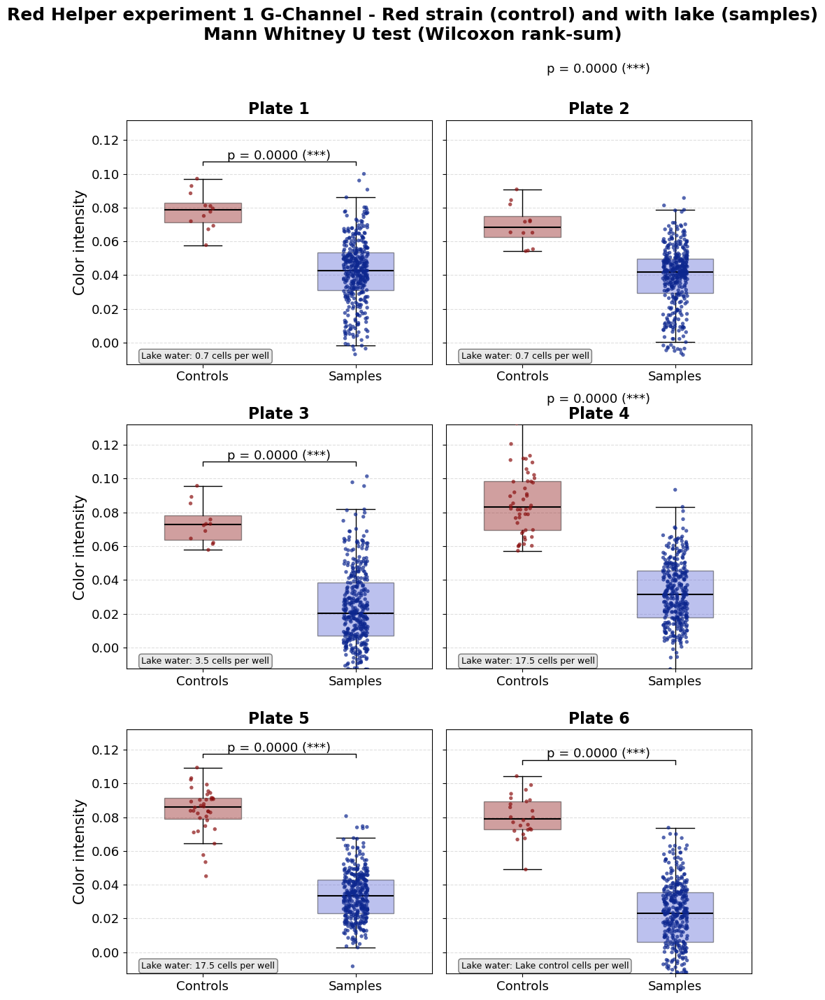

In [116]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

# --- CONFIG ---
CHANNEL = 'G'
LAYOUT_TYPE = {
    1: 'type_A', 2: 'type_A',
    3: 'type_A', 4: 'type_B',
    5: 'type_C', 6: 'type_D',
}
DATA_DIR = '/Users/astr/Documents/Pigments/ScanQuantif/OD_output'
CONCENTRATION_BY_PLATE = {
    1: 0.7, 2: 0.7,
    3: 3.5, 4: 17.5,
    5: 17.5, 6: 'Lake control',
}

plate_specs = [(f'OD_20260617_Red_{scan}', p) for scan in ['12', '35', '67'] for p in ['1', '2']]


def get_tags(layout):
    """0 = Sample, 1 = Control, per plate layout type."""
    tags = np.zeros(384, dtype=int)
    if layout == 'type_A':
        tags[0:24:2] = 1
    elif layout == 'type_B':
        tags[0:48] = 1
    elif layout == 'type_C':
        tags[0:24] = 1
        tags[24:48:2] = 1
    elif layout == 'type_D':
        tags[0:24] = 1
    elif layout == 'type_E':
        grid = tags.reshape(16, 24)
        grid[:, 11:13] = 1
        tags = grid.flatten()
    return tags


def significance_stars(p):
    if p < 0.001:
        return '***'
    elif p < 0.01:
        return '**'
    elif p < 0.05:
        return '*'
    return 'ns'

def format_p_value(p, threshold=0.0001):
    if p < threshold:
        return f'p < {threshold}'
    return f'p = {p:.4f}'


# --- PLOT ---
fig, axes = plt.subplots(3, 2, figsize=(10, 15), sharey=True)
axes = axes.flatten()

fig.suptitle(f'Red Helper experiment 1 {CHANNEL}-Channel - Red strain (control) and with lake (samples)\nMann Whitney U test (Wilcoxon rank-sum)',
             fontsize=18, fontweight='bold')

for global_plate_num, (ax, (prefix, plate_num)) in enumerate(zip(axes, plate_specs), start=1):
    tags = get_tags(LAYOUT_TYPE[global_plate_num])
    ctrl_mask, samp_mask = tags == 1, tags == 0

    filepath = os.path.join(DATA_DIR, f"{prefix}_Plate{plate_num}_{CHANNEL}.csv")
    data = pd.read_csv(filepath, header=None).to_numpy().flatten()

    controls = data[ctrl_mask][np.isfinite(data[ctrl_mask])]
    samples = data[samp_mask][np.isfinite(data[samp_mask])]

    _, p_value = mannwhitneyu(controls, samples, alternative='two-sided')

    bp = ax.boxplot([controls, samples], positions=[1, 2], widths=0.5,
                     patch_artist=True, showfliers=False, medianprops=dict(color='black', linewidth=1.5))
    for patch, color in zip(bp['boxes'], ["#8a1010b9", "#5964d5"]):
        patch.set_facecolor(color)
        patch.set_alpha(0.4)

    rng = np.random.default_rng(0)
    for x, group, color in [(1, controls, "#8a1010"), (2, samples, "#0D278F")]:
        jitter = rng.uniform(-0.08, 0.08, size=len(group))
        ax.scatter(np.full(len(group), x) + jitter, group, color=color,
                   edgecolor='none', s=15, alpha=0.7, zorder=3)

    ax.set_xticks([1, 2])
    ax.set_xticklabels(['Controls', 'Samples'])
    ax.set_title(f'Plate {global_plate_num}', fontsize=16, fontweight='bold')
    ax.tick_params(axis='x', labelsize=13)
    ax.tick_params(axis='y', labelsize=13)
    ax.grid(axis='y', linestyle='--', alpha=0.4)

    stars = significance_stars(p_value)
    y_max = max(controls.max(), samples.max())
    y_range = y_max - min(controls.min(), samples.min())
    y_annot = y_max + 0.05 * y_range
    ax.plot([1, 1, 2, 2], [y_annot, y_annot + 0.02 * y_range, y_annot + 0.02 * y_range, y_annot],
            color='black', linewidth=1)
    ax.text(1.5, y_annot + 0.03 * y_range, f'p = {p_value:.4f} ({stars})',
            ha='center', fontsize=13)
    ax.set_ylim(top=y_annot + 0.15 * y_range)

    conc = CONCENTRATION_BY_PLATE[global_plate_num]
    ax.text(0.05, 0.05, f'Lake water: {conc} cells per well',
            transform=ax.transAxes, fontsize=9, va='top', ha='left',
            bbox=dict(boxstyle='round', facecolor='lightgrey', alpha=0.5))

axes[0].set_ylabel('Color intensity', fontsize=15)
axes[2].set_ylabel('Color intensity', fontsize=15)
axes[4].set_ylabel('Color intensity', fontsize=15)

plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.show()

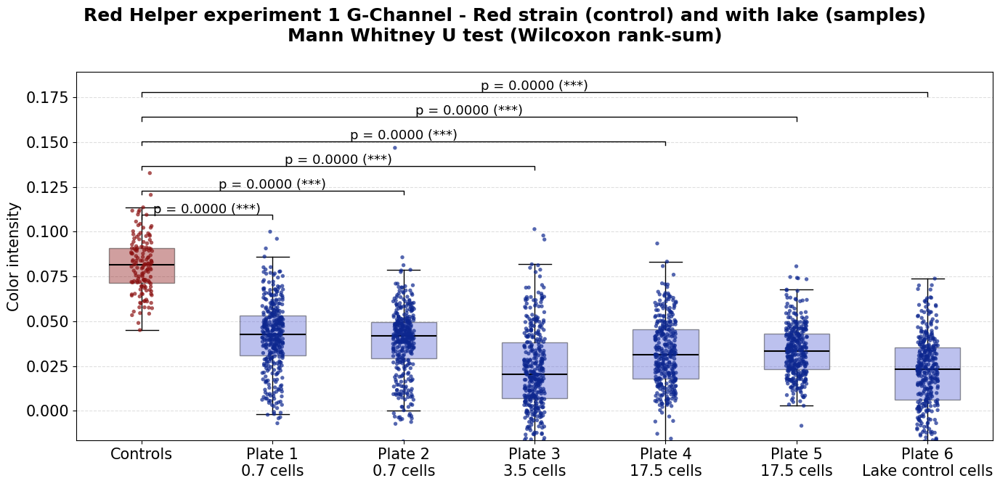

In [98]:
# --- PASS 1: load everything, pool ALL controls (each using its own plate's layout), keep samples per plate ---
controls_pooled = []
samples_by_plate = []
for global_plate_num, (prefix, plate_num) in enumerate(plate_specs, start=1):
    tags = get_tags(LAYOUT_TYPE[global_plate_num])
    ctrl_mask, samp_mask = tags == 1, tags == 0

    filepath = os.path.join(DATA_DIR, f"{prefix}_Plate{plate_num}_{CHANNEL}.csv")
    data = pd.read_csv(filepath, header=None).to_numpy().flatten()
    controls_pooled.extend(data[ctrl_mask][np.isfinite(data[ctrl_mask])])
    samples_by_plate.append(data[samp_mask][np.isfinite(data[samp_mask])])

controls_pooled = np.array(controls_pooled)

p_values = [mannwhitneyu(controls_pooled, samples, alternative='two-sided')[1]
            for samples in samples_by_plate]

all_values = np.concatenate([controls_pooled] + samples_by_plate)
y_top = np.percentile(all_values, 99)
y_bottom = min(0, np.percentile(all_values, 1))
y_range = y_top - y_bottom

# --- PASS 2: plot ---
groups = [controls_pooled] + samples_by_plate
labels = ['Controls'] + [f'Plate {i}\n{CONCENTRATION_BY_PLATE[i]} cells' for i in range(1, 7)]
box_colors = ["#8a1010b9"] + ["#5964d5"] * 6
dot_colors = ["#8a1010"] + ["#0D278F"] * 6
positions = list(range(1, 8))

fig, ax = plt.subplots(figsize=(14, 7))
fig.suptitle(f'Red Helper experiment 1 {CHANNEL}-Channel - Red strain (control) and with lake (samples)\nMann Whitney U test (Wilcoxon rank-sum)',
             fontsize=18, fontweight='bold', y=0.98)

bp = ax.boxplot(groups, positions=positions, widths=0.5,
                 patch_artist=True, showfliers=False, medianprops=dict(color='black', linewidth=1.5))
for patch, color in zip(bp['boxes'], box_colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.4)

rng = np.random.default_rng(0)
for x, group, color in zip(positions, groups, dot_colors):
    jitter = rng.uniform(-0.08, 0.08, size=len(group))
    ax.scatter(np.full(len(group), x) + jitter, group, color=color,
               edgecolor='none', s=15, alpha=0.7, zorder=3)

ax.set_xticks(positions)
ax.set_xticklabels(labels, fontsize=13)
ax.tick_params(axis='y', labelsize=15)
ax.tick_params(axis='x', labelsize=15)
ax.grid(axis='y', linestyle='--', alpha=0.4)

for i, (pos, p_value) in enumerate(zip(positions[1:], p_values)):
    y_annot = y_top + (0.08 + i * 0.12) * y_range
    stars = significance_stars(p_value)
    ax.plot([1, 1, pos, pos], [y_annot, y_annot + 0.02 * y_range, y_annot + 0.02 * y_range, y_annot],
            color='black', linewidth=1)
    ax.text((1 + pos) / 2, y_annot + 0.03 * y_range, f'p = {p_value:.4f} ({stars})', ha='center', fontsize=13)

ax.set_ylim(y_bottom, y_top + (0.08 + len(p_values) * 0.12) * y_range)
ax.set_ylabel('Color intensity', fontsize=15)

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()

p = 0.0000, effect size (r) = -0.907
p = 0.0000, effect size (r) = -0.945
p = 0.0000, effect size (r) = -0.953
p = 0.0000, effect size (r) = -0.959
p = 0.0000, effect size (r) = -0.975


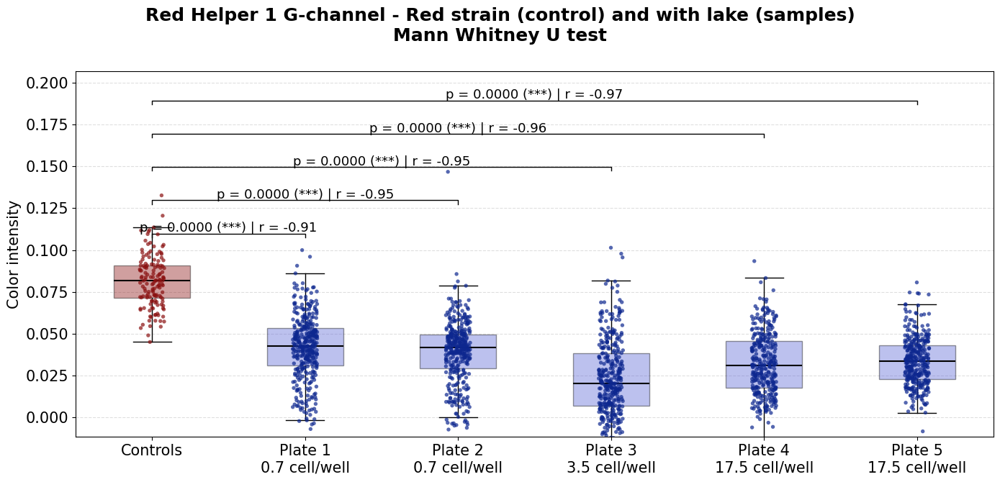

In [ ]:
# --- PASS 1: load everything, pool ALL controls (incl. plate 6), keep samples per plate (excl. plate 6) ---
controls_pooled = []
samples_by_plate = []
sample_plate_nums = []

for global_plate_num, (prefix, plate_num) in enumerate(plate_specs, start=1):
    tags = get_tags(LAYOUT_TYPE[global_plate_num])
    ctrl_mask, samp_mask = tags == 1, tags == 0

    filepath = os.path.join(DATA_DIR, f"{prefix}_Plate{plate_num}_{CHANNEL}.csv")
    data = pd.read_csv(filepath, header=None).to_numpy().flatten()
    controls_pooled.extend(data[ctrl_mask][np.isfinite(data[ctrl_mask])])

    if global_plate_num != 6:                       # now correctly indented inside the loop
        samples_by_plate.append(data[samp_mask][np.isfinite(data[samp_mask])])
        sample_plate_nums.append(global_plate_num)

controls_pooled = np.array(controls_pooled)

# One p-value and effect size per plate, each tested against the same pooled control group
p_values = []
effect_sizes = []
for samples in samples_by_plate:                     # fixed: was samples_by_conc
    u_stat, p_value = mannwhitneyu(controls_pooled, samples, alternative='two-sided')
    effect_size = rank_biserial(u_stat, len(controls_pooled), len(samples))
    p_values.append(p_value)
    effect_sizes.append(effect_size)
    print(f'p = {p_value:.4f}, effect size (r) = {effect_size:.3f}')

all_values = np.concatenate([controls_pooled] + samples_by_plate)
y_top = np.percentile(all_values, 99)
y_bottom = min(0, np.percentile(all_values, 1))
y_range = y_top - y_bottom

# --- PASS 2: plot ---
groups = [controls_pooled] + samples_by_plate
labels = ['Controls'] + [f'Plate {i}\n{CONCENTRATION_BY_PLATE[i]} cell/well' for i in sample_plate_nums]
box_colors = ["#8a1010b9"] + ["#5964d5"] * len(samples_by_plate)
dot_colors = ["#8a1010"] + ["#0D278F"] * len(samples_by_plate)
positions = list(range(1, len(groups) + 1))

fig, ax = plt.subplots(figsize=(14, 7))
fig.suptitle(f'Red Helper 1 {CHANNEL}-channel - Red strain (control) and with lake (samples)\nMann Whitney U test',
             fontsize=18, fontweight='bold', y=0.98)

bp = ax.boxplot(groups, positions=positions, widths=0.5,
                 patch_artist=True, showfliers=False, medianprops=dict(color='black', linewidth=1.5))
for patch, color in zip(bp['boxes'], box_colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.4)

rng = np.random.default_rng(0)
for x, group, color in zip(positions, groups, dot_colors):
    jitter = rng.uniform(-0.08, 0.08, size=len(group))
    ax.scatter(np.full(len(group), x) + jitter, group, color=color,
               edgecolor='none', s=15, alpha=0.7, zorder=3)

ax.set_xticks(positions)
ax.set_xticklabels(labels, fontsize=13)
ax.tick_params(axis='y', labelsize=15)
ax.tick_params(axis='x', labelsize=15)
ax.grid(axis='y', linestyle='--', alpha=0.4)

for i, (pos, p_value, effect_size) in enumerate(zip(positions[1:], p_values, effect_sizes)):
    y_annot = y_top + (0.08 + i * 0.18) * y_range
    stars = significance_stars(p_value)
    ax.plot([1, 1, pos, pos], [y_annot, y_annot + 0.02 * y_range, y_annot + 0.02 * y_range, y_annot],
            color='black', linewidth=1)
    ax.text((1 + pos) / 2, y_annot + 0.03 * y_range,
            f'{format_p_value(p_value)} ({stars}) | r = {effect_size:.2f}', ha='center', fontsize=13)

ax.set_ylim(y_bottom, y_top + (0.08 + len(p_values) * 0.18) * y_range )
ax.set_ylabel('Color intensity', fontsize=15)

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.show()